old title: klarizsofiMice

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
from scipy import signal
import statsmodels.api as sm
import math
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy.signal import resample
from utils.plotting import plot_trajectory
import statistics

In [161]:
# #for draft
# data_frame_with_cells = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")

In [2]:
df_all = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")

In [162]:
# df_mice = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\all_mice_df.pkl")
# df_rats = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\all_rats_df.pkl")

In [69]:
# print(len(df_all))
# print(len(df_mice))
# print(len(df_rats))
#нужно брать trajectory, а не position + trajectory_times
#но не все записи одинаково хороши. например, 1, 7 пустые

In [67]:
# print(df_mice['session_id'].nunique())
# print(df_rats['session_id'].nunique())
# print(df_all['session_id'].nunique())

##### (not neccessary) 1. determine whether we have mouse or rat data

In [65]:
#Получается, в df_all лежат сессии мышей
mice_sess = df_mice['session_id'].unique()
rats_sess = df_rats['session_id'].unique()
df_sess = df_all['session_id'].unique()
sim_df_mice = len(set(df_sess).intersection(set(mice_sess))) / len(set(df_sess)) * 100
sim_df_rats = len(set(df_sess).intersection(set(rats_sess))) / len(set(df_sess)) * 100
print(sim_df_mice)
print(sim_df_rats)

100.0
0.0


##### (not neccessary) 2. make trajectory df

In [21]:
def makebasDF(n):
    x = df_all['trajectory_x'].iloc[n] 
    y = df_all['trajectory_y'].iloc[n]
    time = df_all['trajectory_times'].iloc[n]
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

In [11]:
# plt.plot(data_frame_with_cells.iloc[7]['trajectory_times'], data_frame_with_cells.iloc[7]['trajectory_y'])

In [6]:
#positions_x соотвествует firing_times
print(len(df_all.iloc[0]['firing_times']))
len(df_all.iloc[0]['position_x'])

7648


7648

##### 3. convert firing time in seconds (trajectory time is already in seconds)

In [3]:
dat1=df_all[120:121]
traj_time = dat1['trajectory_times'].iloc[0]
print(len(traj_time)/max(traj_time))
#sampling rate is 30 samples / sec, time is in seconds

30.083133307902084


In [4]:
fire_time_old = dat1['firing_times'].iloc[0]
fire_time = dat1['firing_times'].iloc[0] / 30000

In [5]:
# fig, (ax1, ax2) = plt.subplots(2, 1)
# ax1.plot(fire_time)
# ax2.plot(traj_time)

#### 4. Smoothing of neuro recording

In [5]:
sigm = 0.01 * 30000
#0.015 too slow

In [6]:
fire_time_old= fire_time_old.astype(int)
l = max(fire_time_old) + 1
signal = np.zeros(l)
signal[fire_time_old] = 1

In [7]:
sign_gaus = gaussian_filter1d(signal, sigm)
#plt.plot(sign_gaus[:100500])

1472.8078


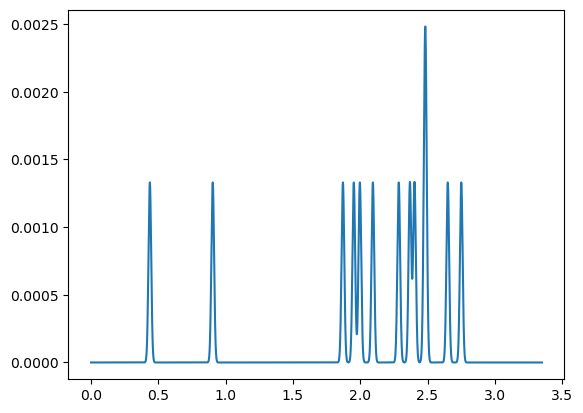

In [8]:
sign_time = np.arange(len(sign_gaus))
sign_time = sign_time / 30000
print(max(sign_time))
plt.plot(sign_time[:100500],sign_gaus[:100500])

#### 5. resample neuro recording and trajectory recording to 0.0333

#чтобы перевести время тректории и сигнала в 1 семплинг рейт нужно немного обрезать время, чтобы все начиналось и заканчивалась в 1 и то же время
#пусть это будет от 1 с до 1470 c

In [9]:
#compare dt in trejectory and neuro recordings
print('signal time')
print('min',min(sign_time))
print('max',max(sign_time))
print('dt',max(sign_time)/len(sign_time), '\n')
print('trajectory time')
print('min',min(traj_time))
print('max',max(traj_time))
print('dt', max(traj_time)/len(traj_time))


signal time
min 0.0
max 1472.8078
dt 3.333333257891644e-05 

trajectory time
min 0.037448266664458885
max 1472.7521746666657
dt 0.03324121825226647


In [10]:
def makebasDF(n):
    x = df_all['trajectory_x'].iloc[n] 
    y = df_all['trajectory_y'].iloc[n]
    time = df_all['trajectory_times'].iloc[n]
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['traj_time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

In [11]:
#время от 1 с до 1400
tr_df = makebasDF(120)
tr_np = tr_df.to_numpy()
mask = (tr_np[:, 0] >= 1) & (tr_np[:, 0] <= 1400)
tr_np = tr_np[mask, :]


In [12]:
sign_np = np.dstack((sign_time, sign_gaus))
sign_np = sign_np[0]
#время от 1 с до 1400
mask = (sign_np[:, 0] >= 1) & (sign_np[:, 0] <= 1400)
sign_np = sign_np[mask, :]


sign_time and sign_gaus are obtained in part 4

In [13]:
new_dt = 0.0333
num_new_points = int (1400 / new_dt)

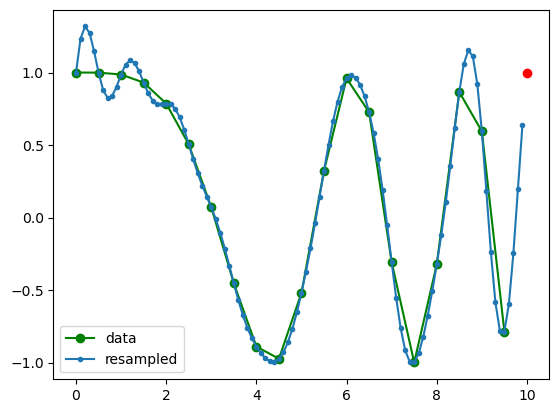

In [132]:
x = np.linspace(0, 10, 20, endpoint=False)
y = np.cos(-x**2/6.0)
f = signal.resample(y, 100)
xnew = np.linspace(0, 10, 100, endpoint=False)
plt.plot(x, y, 'go-', xnew, f, '.-', 10, y[0], 'ro')
plt.legend(['data', 'resampled'], loc='best')
plt.show()

In [16]:
#блин мне порю не хватает RAM для этой ячейки
new_sign = resample(sign_gaus, num_new_points, axis=0)

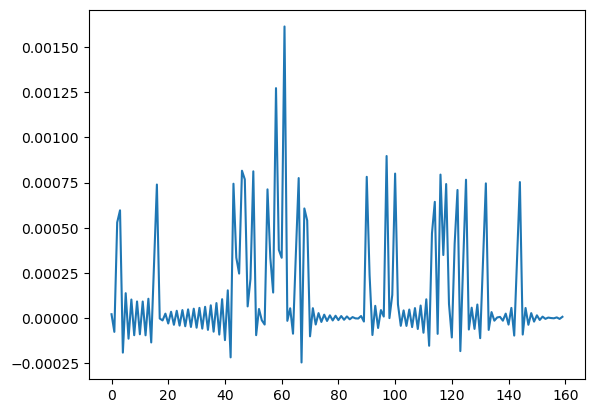

In [19]:
plt.plot(new_sign[10:170])

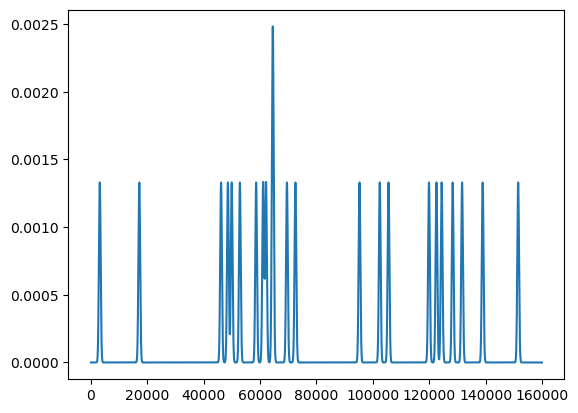

In [147]:
#это до ресемплинга

In [125]:
tr_np[:, 1:].shape

(42085, 2)

In [22]:

resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
new_time = np.linspace(0, 1400, num_new_points)
#new_sign = resample(sign_np[:, 1:], num_new_points, axis=0)
resampled_df = pd.DataFrame({'time': new_time,
                                     'x': resampled_dfnp[:, 0], 
                                     'y': resampled_dfnp[:, 1],
                                    'signal':new_sign})


In [26]:
len(df_all)

375

In [25]:
df_all['session_id'].value_counts()

M11_2018-03-12_17-58-58_of    12
M5_2018-02-26_16-47-52_of      9
M5_2018-02-15_17-23-36_of      8
M5_2018-02-16_15-57-18_of      7
M5_2018-03-01_13-29-52_of      7
                              ..
M2_2018-02-22_15-25-44_of      1
M3_2018-02-19_14-19-51_of      1
M3_2018-02-22_16-00-01_of      1
M4_2018-02-20_16-33-10_of      1
M9_2018-03-20_15-25-22_of      1
Name: session_id, Length: 130, dtype: int64

In [24]:
df_all[120:121]

,session_id,cluster_id,position_x,position_y,hd,firing_maps,firing_times,trajectory_hd,trajectory_x,trajectory_y,trajectory_times
16,M13_2018-04-23_09-34-20_of,17,"[90.47764306818182, 85.55514306818182, 70.2504...","[6.3370738636363635, 2.852365909090911, 3.1556...","[-148.20329661102653, -144.92416909992747, -14...","[[3.683157061784376, 3.9694895315161522, 4.428...","[13111.0, 27129.0, 56142.0, 58567.0, 59921.0, ...",0 149.472543 1 149.464112 2 ...,0 95.075018 1 95.099814 2 ...,0 7.693317 1 7.757005 2 ...,0 0.037448 1 0.070088 2 ...


In [28]:
resampled_df.to_csv('M13_2018-04-23_09-34-20_of_17.csv', index=False)

In [33]:
# #resample trajectory to dt 0.0333
# new_dt = 0.0333
# num_new_points = int (max(tr_df['time']) / new_dt)
# resampled_dfnp = resample(tr_df.to_numpy()[:, 1:], num_new_points, axis=0)
# new_time = np.linspace(tr_df['time'].iloc[0], tr_df['time'].iloc[-1], num_new_points)
# resampled_df = pd.DataFrame({'time': new_time,
#                                      'x': resampled_dfnp[:, 0], 
#                                      'y': resampled_dfnp[:, 1]})

In [38]:
tr_df.to_numpy()

array([[3.74482667e-02, 9.50750181e+01, 7.69331705e+00],
       [7.00882667e-02, 9.50998135e+01, 7.75700455e+00],
       [1.01576267e-01, 9.49698022e+01, 7.85381591e+00],
       ...,
       [1.47268811e+03, 3.48535862e+01, 4.62452898e+01],
       [1.47272005e+03, 3.46997453e+01, 4.63337670e+01],
       [1.47275217e+03, 3.45519905e+01, 4.62928222e+01]])

In [ ]:
#sign_time[:100500],sign_gaus[:100500]

In [34]:
# def resample_data_to_larger_timestep(df, original_dt, new_dt):
    

#     num_original_points = df.shape[0]
#     duration = num_original_points * original_dt
#     num_new_points = int(duration / new_dt)
    
#     resampled_dfnp = resample(df.to_numpy()[:, 1:], num_new_points, axis=0)
#     new_time = np.linspace(df['time'].iloc[0], df['time'].iloc[-1], num_new_points)
#     #added 3 down change
#     #print(resampled_dfnp[:, 0])
#     #print(resampled_dfnp)
#     if len(resampled_dfnp) > 1:
#         resampled_df = pd.DataFrame({'time': new_time,
#                                      'x': resampled_dfnp[:, 0], 
#                                      'y': resampled_dfnp[:, 1]})
#     #added 2 down change
#     else:
#         resampled_df = pd.DataFrame(columns=['time','x','y'])
#     return resampled_df

# draft start

##### 3. пытаюсь наложить время спайков на время траектории. опираясь на их код: https://github.com/MattNolanLab/grid_cell_analysis/blob/master/SimulationCode/import_behavior.py

Чтобы перевести время траектории во время нейронов (которое выражено в sampling points) нужно:


1) увеличить временное разрешение до 0.001 / 30секунды : t_array=np.arange(0,max(tr_t),res_t). траекторию интерполировать

res_t=0.001 / 30

почему:

1) в статье предлагают увеличить временное разрешение до 0.001 секунды (вроде): t_array=np.arange(0,max(tr_t),0.001). и интерполировать траекторию

2) однако тогда временные точки нейронной активности идут с разренешием в 30 раз больше, не совсем понятно почему. это плохо, потому что временные точки нейронной активности выражены в sampling points ко времени траектории. надеюсь, что понимаю все верно, есть возможность проверки

из описания данных: trajectory times: (~30 samples / sec frame rate). имхо это никак не объясняет почему надо получивышиеся время умножать на 30.

###### 3.1 найдем на что нужно fps измененного trajectory_times с повышенным разрешением 0., удалим пробы с другим разрегением

In [7]:
#not neccessary to run
new_n_samp = []
fire_t_max = []
traj_new_len = []
for i in range(len(df_all)):
    fire_t = df_all['firing_times'].iloc[i]
    tr_t = df_all['trajectory_times'].iloc[i]
    res_t=0.001
    t_array=np.arange(0,max(tr_t),res_t)
    new_n_samp.append(max(fire_t) / len(t_array))
    fire_t_max.append(max(fire_t))
    traj_new_len.append(len(t_array))

In [13]:
#not neccessary to run
statistics.median(new_n_samp)
#!!! 30 !!!

29.997652703665015

Text(0, 0.5, 'frames per second')

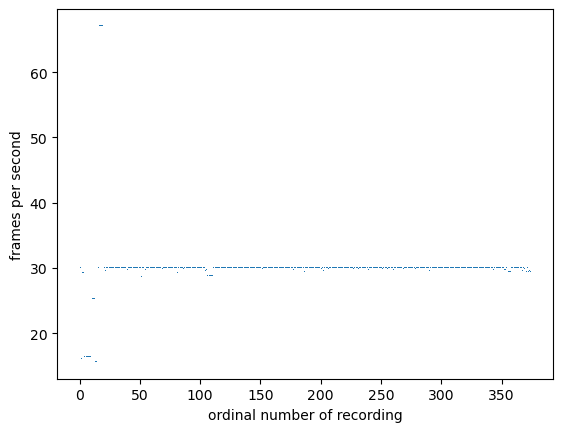

In [10]:
#not neccessary to run
plt.plot(new_n_samp, ',')
plt.xlabel('ordinal number of recording')
plt.ylabel('frames per second')

{'bodies': [<matplotlib.collections.PolyCollection at 0x2ac6586ba90>],
 'cmaxes': <matplotlib.collections.LineCollection at 0x2ac601c1df0>,
 'cmins': <matplotlib.collections.LineCollection at 0x2ac6586bfa0>,
 'cbars': <matplotlib.collections.LineCollection at 0x2ac65885310>}

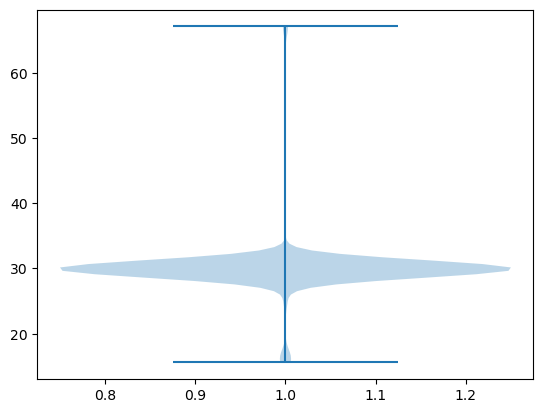

In [11]:
#not neccessary to run
plt.violinplot(new_n_samp)

In [17]:
def computate_new_numb_frames(row):
    #compute approximate number of firing time frames per 1 trajectory time point (with resolution 0.001)
    #we takes recordings where resulting value is 30
    fire_t = row[6]
    tr_t = row[10]
    res_t=0.001
    t_array=np.arange(0,max(tr_t),res_t)
    n_frames = max(fire_t) / len(t_array)    
    return n_frames

df_all['new_numb_frames'] = df_all.apply(computate_new_numb_frames, axis=1)

old_df_all = df_all.copy()

df_all = old_df_all.loc[(old_df_all['new_numb_frames'] >= 29) & (old_df_all['new_numb_frames'] <= 31)]
print(len(old_df_all))
print(len(df_all))

#проверили, что с новым res_t время фаеринга (выраженное в sampling points of trajectory time) соотсетсвует trajectory time
ft = df_all.iloc[57]['firing_times']
trt = df_all.iloc[57]['trajectory_times']

res_t=0.001
res_t = res_t / 30
t_array=np.arange(0,max(trt),res_t)
print(len(t_array))
print(max(ft))

##### 3.2 (not neccessary to run) what are they doing in their code? doesn't work(

In [46]:
dat1=df_all[112:113]
location_x_p=dat1.position_x
location_x_p = location_x_p[~pd.isnull(location_x_p)]
location_y=dat1.position_y[~pd.isnull(location_x_p)]
t_pre=dat1.trajectory_times[~pd.isnull(location_x_p)]

In [44]:
# print(len(location_x_p.iloc[0]))
# print(len(location_x_p[~pd.isnull(location_x_p)].iloc[0]))

In [ ]:

# #import dataframe
# all_dat=pd.read_pickle("./trajectory_all_mice.pkl") #+
# dat1=all_dat[112:113] #+
# location_x_p=dat1.position_x #+
# location_x=location_x_p[~np.isnan(location_x_p)] #не работает, заменю на pd.isnull #check if no list with x position when cell fired
# location_y=dat1.position_y[~np.isnan(location_x_p)] #same
# #h=dat1.hd[~np.isnan(location_x_p)] #head direction not necessary for us for now
# t_pre=dat1.synced_time[~np.isnan(location_x_p)]#seconds #same, but we have trajectory_times, not synced_time
# t=t_pre-t_pre[0] #не работает что они имели в виду????????????? HELP
# res_t=0.001
# res=1 #cm


##### 3.3 перевести trajectory times всех мышей с примерно одинаковым семплинг рейтом firing times в траекторию с res_t = 0.001 / 30 и интерполировать траекторию
похоже как будто они так и получают координаты траектории?

In [ ]:
# #edited function from https://github.com/MattNolanLab/grid_cell_analysis/blob/master/SimulationCode/import_behavior.py
# def get_data(t, h, location_x, location_y, res_t):
#     max_t = max(t)
#     t_array=np.arange(0,max_t,res_t) #1 s bins, 0-1, 1-2...
#     shape=(t_array.shape[0],2)
#     positions=np.zeros(shape)
#     shape=(t_array.shape[0])
#     hd=np.zeros(shape)

#     for i in np.arange(t_array.shape[0]):
#         positions[i,0]=np.mean(location_x[(t>=t_array[i]) & (t<(t_array[i]+res_t))])
#         positions[i,1]=np.mean(location_y[(t>=t_array[i]) & (t<(t_array[i]+res_t))])
#         hd[i]=np.mean(h[(t>=t_array[i]) & (t<(t_array[i]+res_t))])
    
#     df = pd.DataFrame(positions[:,0]).interpolate()
#     positions[:,0]=df.values[:,0]
#     df2 = pd.DataFrame(positions[:,1]).interpolate()
#     positions[:,1]=df2.values[:,0]
    
#     df3 = pd.DataFrame(hd).interpolate()
#     hd=df3.values
#     hd=hd+180
    
#     x=max(positions[:,0])
#     y=max(positions[:,1])
    
#     return positions, x, y, hd, t_array

разберем код на 1 мыши

In [64]:
# #bad
# dat1.trajectory_times[~pd.isnull(location_x_p)] #у них

# #bad
# dat1=df_all[112:113]
# t = dat1.trajectory_times[~pd.isnull(location_x_p)]
# location_x=dat1.position_x[~pd.isnull(location_x_p)]
# location_y=dat1.position_y[~pd.isnull(location_x_p)] #а они почему-то проверяют не является ли наном локейшн х
# #блин у меня в их формате времени и тд не идет код, буду по-другому делать

In [146]:
res_t=0.001 / 30

#возьмем значения для 1 сессии 1 мыши
t = df_all['trajectory_times'].iloc[112] #у меня
location_x=df_all['trajectory_x'].iloc[112]
location_y=df_all['trajectory_y'].iloc[112]
location_x_n = np.array(location_x)
location_y_n = np.array(location_y)
#t, x, y соотвествуют друг другу по размеру
print(len(t_n))
print(len(location_x_n))

#сделаем время с бОльшим разрешением
max_t = max(t)
t_array=np.arange(0,max_t,res_t) #1 s bins, 0-1, 1-2...

#пустой нампи для х и у
shape=(t_array.shape[0],2)
positions=np.zeros(shape)

39068
39068


In [151]:
#find minimal resolution in t of trajectory
delt_t = []
for i in range(1, len(t_n)):
    delt_t.append(t_n[i] - t_n[i-1])
print('максимальное время между соседними семплами',max(delt_t))
print('среднее время между соседними семплами', (max(t_n) / len(t_n)))
min_res = max(delt_t)

#example: find points from t_n close to t_array[1000]
t_n = t.to_numpy()
kk = (t_n>=t_array[1000] - min_res) & (t_n<(t_array[1000]+min_res)) 
print(len(kk))
print(kk.sum())

максимальное время между соседними семплами 0.05875200000446057
среднее время между соседними семплами 0.03324002347360157
39068
3


In [163]:
#example: find points from location_x_n close to t_array[1000]
print(location_x_n[(t_n>=t_array[1000] - min_res) & (t_n<(t_array[1000]+min_res))])
print(np.mean(location_x_n[(t_n>=t_array[1000] - min_res) & (t_n<(t_array[1000]+min_res))]))

[84.32236364 84.20952273 84.049625  ]
84.19383712121213


In [155]:
#эта ячейка выполняется час
for i in np.arange(t_array.shape[0]):
    positions[i,0]=np.mean(location_x_n[(t_n>=t_array[i] - min_res) & (t_n<(t_array[i] + min_res))]) 
    positions[i,1]=np.mean(location_y_n[(t_n>=t_array[i] - min_res) & (t_n<(t_array[i] + min_res))])

In [159]:
np.save('example_positions_112_after_removing_bad_sr', positions)

In [160]:
positions

array([[84.26594318,  8.00391932],
       [84.26594318,  8.00391932],
       [84.26594318,  8.00391932],
       ...,
       [25.92638636, 76.00161591],
       [25.92638636, 76.00161591],
       [25.92638636, 76.00161591]])

In [158]:
max(t_n) / len(t_n)

0.03324002347360157

In [166]:
position_x=df_all['position_x'].iloc[112] #расположение во время фаеринга
position_y=df_all['position_y'].iloc[112]
fire_t = df_all['firing_times'].iloc[112]

In [194]:
print(len(fire_t))
print(len(position_x))

46239
46239


In [179]:
x = positions[:, 0]
y = positions[:, 1]

In [189]:
fire_t_int = fire_t.astype(int)

In [193]:
fire_t_int = fire_t_int[fire_t_int < 38958638]

In [191]:
x_fire = x[fire_t_int]

IndexError: index 38959392 is out of bounds for axis 0 with size 38958638

##### 4. делаем по-другому
1) сигнал приводим в удобную форму и сглаживаем

2) переводим время и сигнал в 1 семплинг рейт

In [200]:
fire_t = df_all['firing_times'].iloc[112]
fire_t= fire_t.astype(int)

In [204]:
l = max(fire_t) + 1
#signal = np.zeros(l)
signal2 = np.zeros(l)

In [205]:
signal2[fire_t] = 1

сигнал в виде значений 0 и 1 в каждую "точку" времени

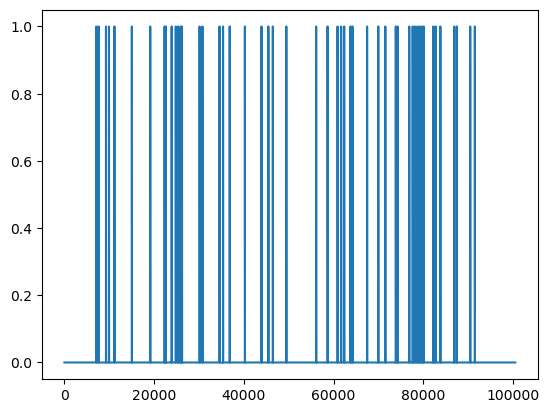

In [215]:
plt.plot(signal2[:100500])

оригинальный сигнал в котором обозначены временные "точки" спайков

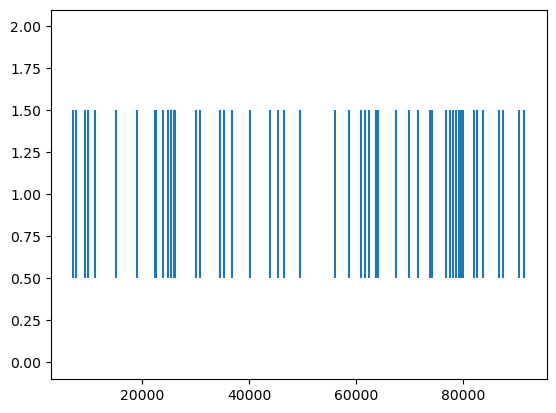

In [209]:
plt.eventplot(fire_t[:50])

сглаженный сигнал в виде значений 0 и 1 в каждую "точку" времени

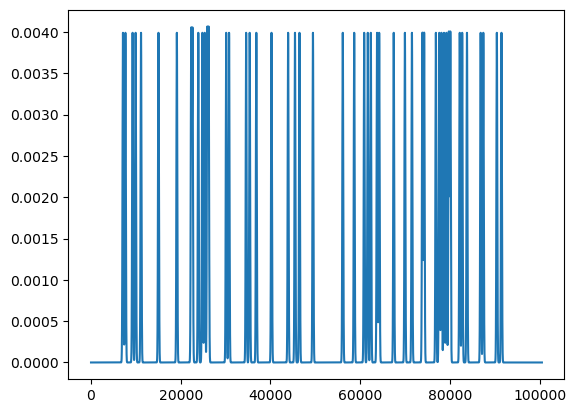

In [220]:
from scipy.ndimage import gaussian_filter1d
sign_gaus = gaussian_filter1d(signal2, 100)
plt.plot(sign_gaus[:100500])


видимо, надо все-таки сделать гистограму и потом сгладить

In [ ]:
y, binEdges, _ = plt.hist(dffor1line['delta_angle'], 20)
        x = 0.5 * (binEdges[1:] + binEdges[:-1])
        all_hist[str(numb)][na] = [x, y]

# draft

##### code https://github.com/MattNolanLab/grid_cell_analysis/blob/master/SimulationCode/import_behavior.py

In [90]:
#странно снова не работает их код и по моей логике и не может работать??????
#t это время траектории
#t_array это время траектории с новым резолюшином
for i in np.arange(t_array.shape[0]):
    positions[i,0]=np.mean(location_x[(t_n>=t_array[i]) & (t_n<(t_array[i]+res_t))]) 
    positions[i,1]=np.mean(location_y[(t_n>=t_array[i]) & (t_n<(t_array[i]+res_t))])

TypeError: only integer scalar arrays can be converted to a scalar index

In [ ]:
for i in np.arange(t_array.shape[0]):
    positions[i,0]=np.mean(location_x[(t>=t_array[i]) & (t<(t_array[i]+res_t))])
    positions[i,1]=np.mean(location_y[(t>=t_array[i]) & (t<(t_array[i]+res_t))])
    hd[i]=np.mean(h[(t>=t_array[i]) & (t<(t_array[i]+res_t))])

df = pd.DataFrame(positions[:,0]).interpolate()
positions[:,0]=df.values[:,0]
df2 = pd.DataFrame(positions[:,1]).interpolate()
positions[:,1]=df2.values[:,0]

df3 = pd.DataFrame(hd).interpolate()
hd=df3.values
hd=hd+180

x=max(positions[:,0])
y=max(positions[:,1])


##### draft new

In [ ]:
plt.plot()

In [50]:
# for i in (7, 57, 112, 245, 200, 21, 300, 3, 13, 23, 43, 33, 44, 53, 63, 74):
#     df = makebasDF(i)
#     tr_t = df_all['trajectory_times'].iloc[i]
#     plt.plot(tr_t)


29.997652703665015

В описании: 'trajectory_times': sampling times of the trajectory of the animal. (~30 samples / sec frame rate).

In [83]:
# for i in (7, 57, 112, 245, 200, 21, 300, 3, 13, 23, 43, 33, 44, 53, 63, 74):
#     #df = makebasDF(i)
#     fire_t = df_all['firing_times'].iloc[i]
#     tr_t = df_all['trajectory_times'].iloc[i]
#     res_t=0.001
#     t_array=np.arange(0,max(tr_t),res_t)
#     print(len(t_array) / 100000)
#     print(max(fire_t) / 100000)
#     #ratio = 
#     print(max(fire_t) / len(t_array))
#     print('\n')
# #блин у них мне кажется плывет семплинг
    

In [84]:
# for i in (7, 57, 112, 245, 200, 21, 300, 3, 13, 23, 43, 33, 44, 53, 63, 74):
#     df = makebasDF(i)
#     fire_t = df_all['firing_times'].iloc[i]
#     tr_t = df_all['trajectory_times'].iloc[i]
#     #res_t=0.001
#     #t_array=np.arange(0,max(tr_t),res_t)
#     #print(len(t_array) / 100000)
#     print(max(fire_t) / 100000)
#     print(max(t_array) / max(fire_t))
#     print('\n')
# #блин у них мне кажется плывет семплинг
# #поч тут менее ровно выходит? взяли время а не количество точек. неровный семплынг рейт

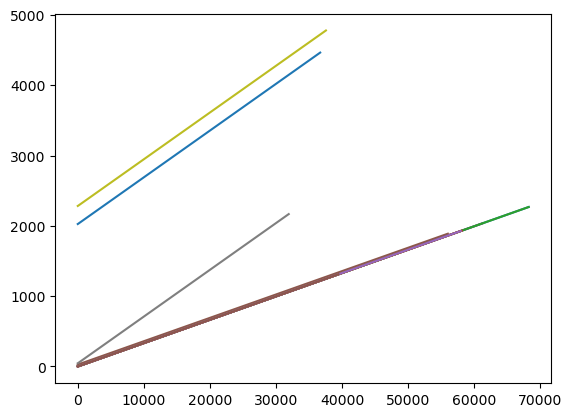

In [87]:
# n = 20
# fire_t = df_all['firing_times'].iloc[n]
# tr_t = df_all['trajectory_times'].iloc[n]
# sr = len(tr_t) / (max(tr_t) - min(tr_t))
# print(sr)
# #а тут реально 30
# plt.plot(tr_t, label = 'traj')
# plt.plot(fire_t / sr, label = 'fire')
# plt.legend()

30.083494333821207


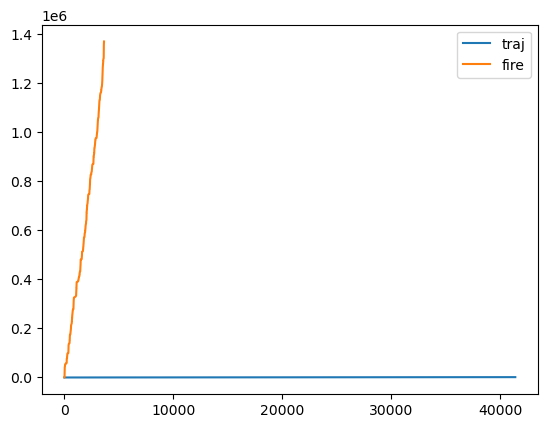

In [88]:
n = 211
fire_t = df_all['firing_times'].iloc[n]
tr_t = df_all['trajectory_times'].iloc[n]
sr = len(tr_t) / (max(tr_t) - min(tr_t))
print(sr)
#а тут реально 30
plt.plot(tr_t, label = 'traj')
plt.plot(fire_t / sr, label = 'fire')
plt.legend()

In [85]:
# n = 57
# fire_t = df_all['firing_times'].iloc[n]
# tr_t = df_all['trajectory_times'].iloc[n]
# sr = len(tr_t) / (max(tr_t) - min(tr_t))
# print(sr)
# #а тут реально 30
# plt.plot(tr_t, label = 'traj')
# plt.plot(fire_t, label = 'fire')
# plt.legend()

In [102]:
# print(len(df_all.iloc[0]['firing_times']))
# len(df_all.iloc[0]['trajectory_times'])

In [103]:
# df = makebasDF(0)
# fire_t = df_all['firing_times'].iloc[0]
# f_m = df_all['firing_maps'].iloc[0]

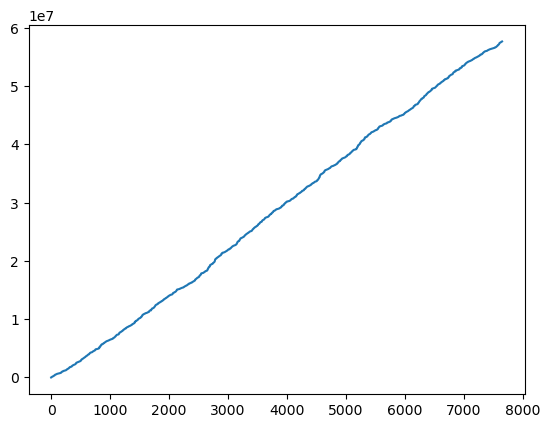

In [61]:
plt.plot(fire_t)

In [59]:
min(fire_t)

160.0

In [54]:
max(fire_t)

57684211.0

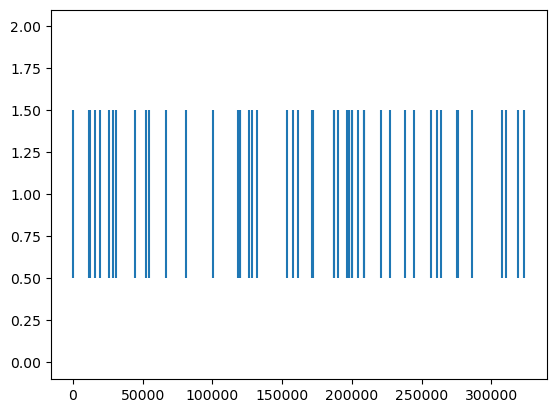

In [86]:
plt.eventplot(fire_t[:50])

In [76]:
df

,time,x,y
0,0.036803,1.717897,7.242977
1,0.101238,1.804099,6.787384
2,0.165366,1.670926,6.777222
3,0.229098,1.344376,5.804426
4,0.293456,1.017826,4.831630
...,...,...,...
28927,1923.218486,10.790374,47.376621
28928,1923.282166,10.868630,47.632575
28929,1923.346422,10.741499,48.086064
28930,1923.410333,10.350916,48.195893


# draft

#### old: записи мышей

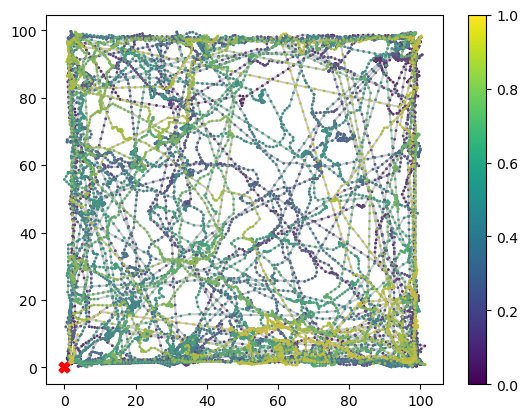

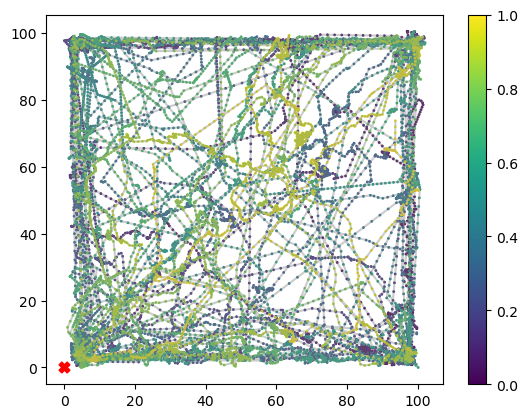

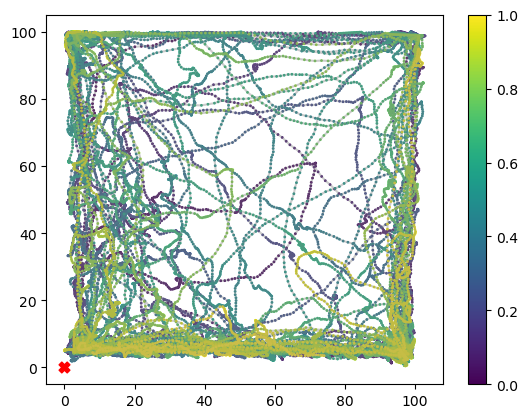

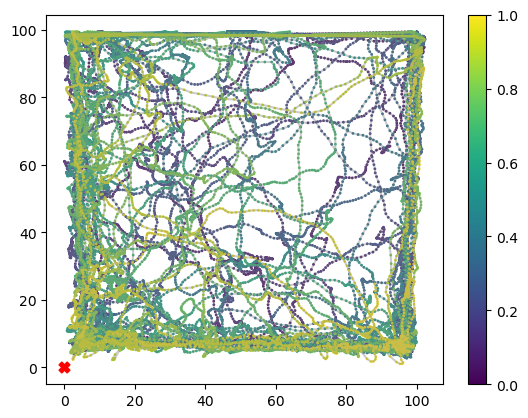

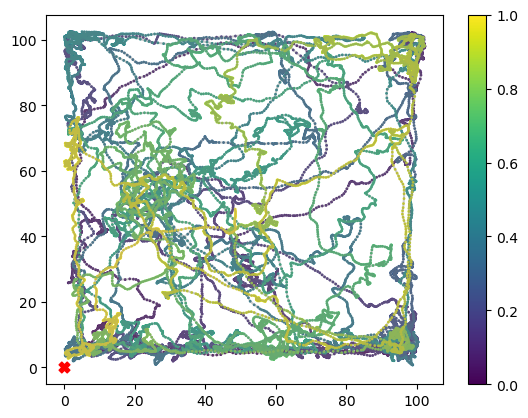

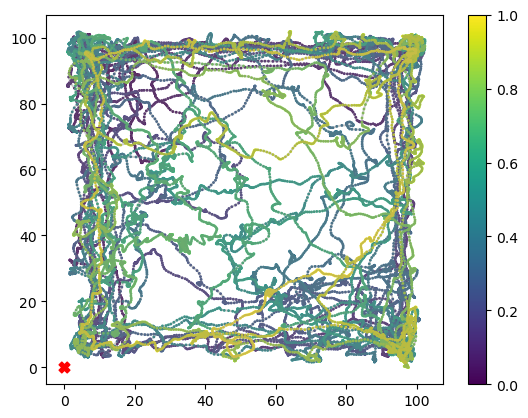

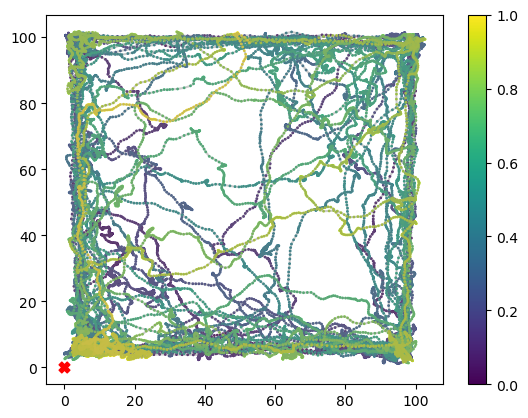

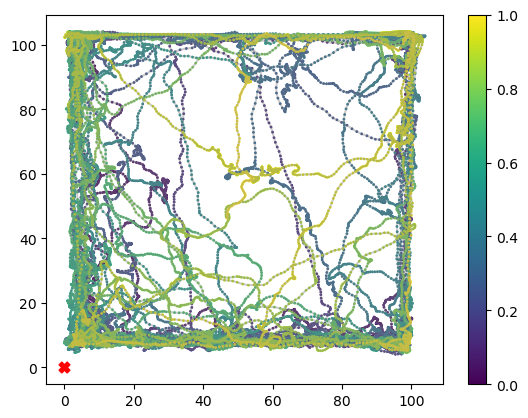

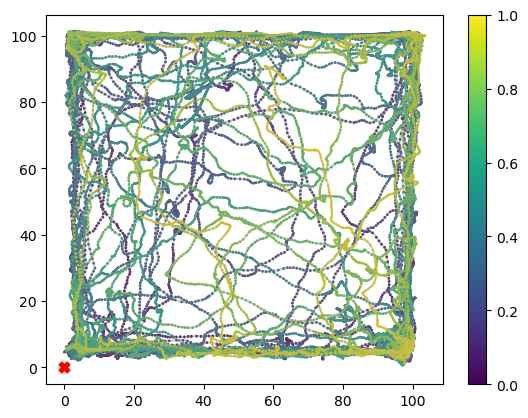

In [10]:
dict1c_all = {'0': makebasDF(0), '15': makebasDF(15), '85' : makebasDF(85),  '165' : makebasDF(165), '215' : makebasDF(215),
              '305' : makebasDF(305),  '315' : makebasDF(315),  '325' : makebasDF(325), '345' : makebasDF(345)}

In [103]:
for i in dict1c_all:
    dict1c_all[i] = addFilteredV(dict1c_all[i])
    
    print(len(dict1c_all[i]))
    dict1c_all[i] = returnStepsDFdeltaAng(dict1c_all[i], 0.5)
    print(len(dict1c_all[i]))
    
    dict1c_all[i] = addNearWalls(dict1c_all[i])

15042
1881


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 40
C:\Us

10.30288921590909 89.48016567045454
15040
1881


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Us

10.23953772727273 90.27543045454546


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx


30084
1906


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Us

10.521322300699302 90.14482252447553


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx


30082
1905


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\U

12.026462730776935 89.8046554860833


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx


30084
1905


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\U

12.109141477272725 92.54139147727271


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx


30083
1905


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 40
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Use

10.527906704545453 91.46406034090907
30081
1905


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Us

11.312646363636365 91.47335363636364


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx


30084
1906


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Us

14.309309461722489 94.0900051555024


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:25: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx


30080
1905


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 40
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11636\3392427670.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Us

11.89128227272727 91.26031318181818


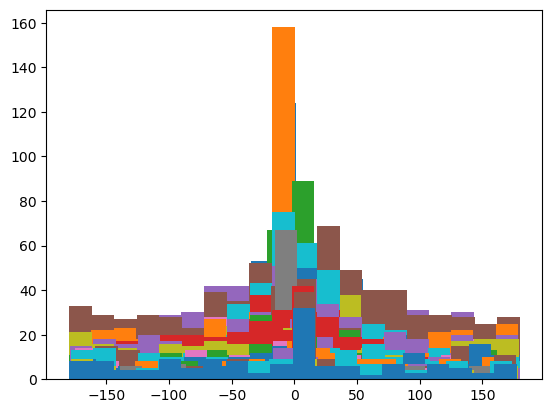

In [106]:
all_hist = {}
for numb in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    all_hist[str(numb)] = {}
    for na in dict1c_all:
        dffor1line = dict1c_all[na].loc[dict1c_all[na]['near_wall'] == numb]
        y, binEdges, _ = plt.hist(dffor1line['delta_angle'], 20)
        x = 0.5 * (binEdges[1:] + binEdges[:-1])
        all_hist[str(numb)][na] = [x, y]

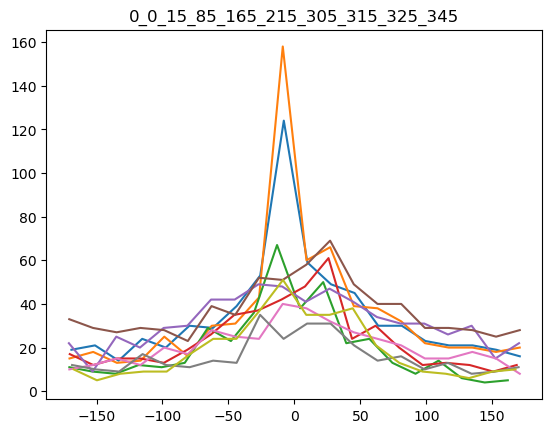

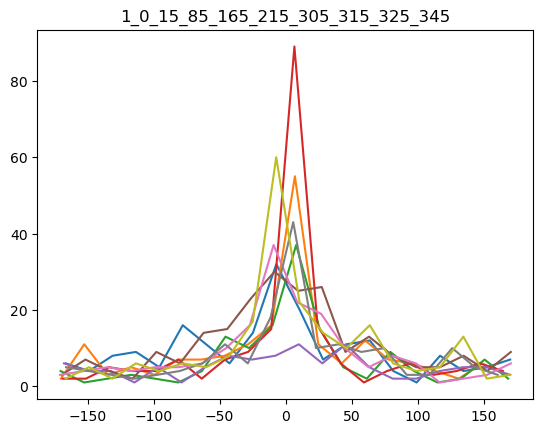

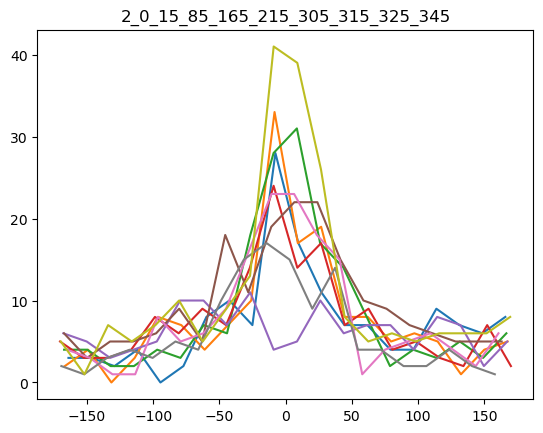

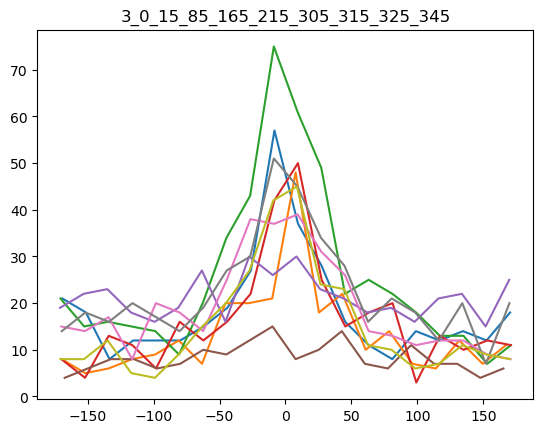

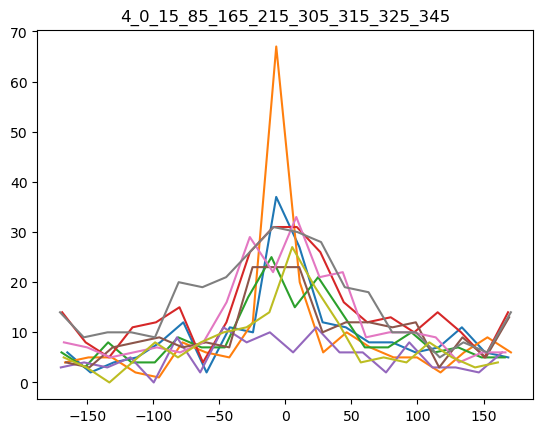

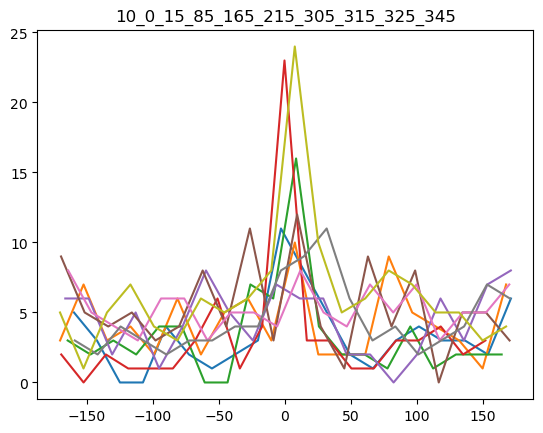

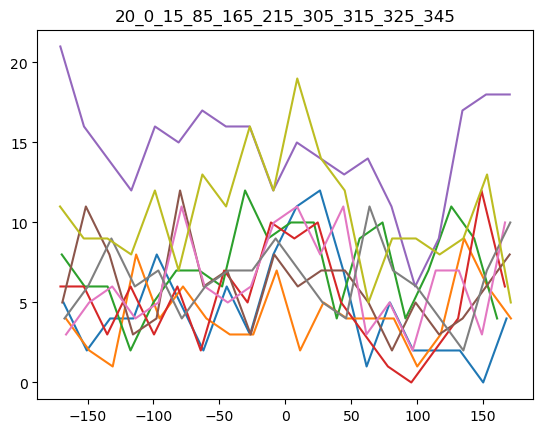

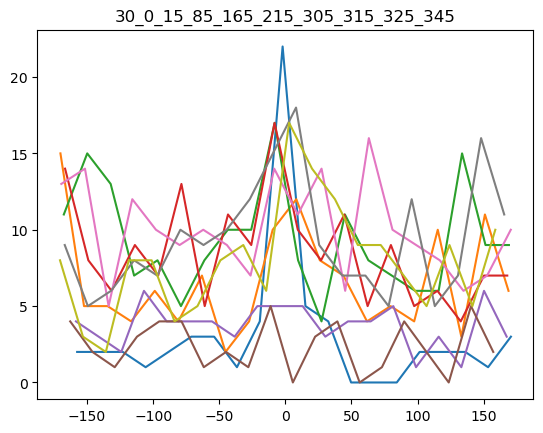

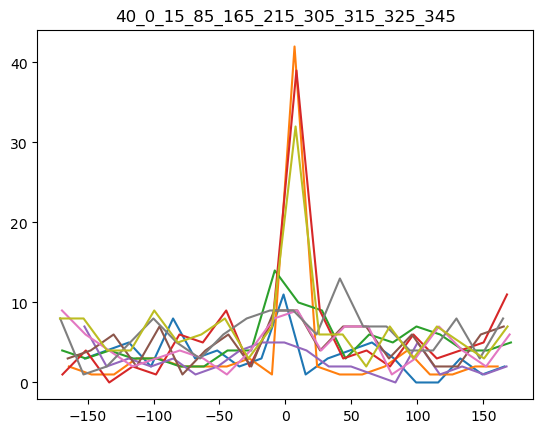

In [107]:
for i in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    plt.figure()
    ax = plt.gca()
    #ax.set_xlim([-90, 270])
    #ax.set_ylim([0, 60])
    tit = str(i)
    for na in dict1c_all:
        plt.plot(all_hist[str(i)][na][0], all_hist[str(i)][na][1])
        tit = tit + '_' + na
    plt.title(tit)
    #plt.savefig('C:\\Users\\Lenovo\\1navigation\\angles_hist\\delta_ang\\'+tit)
    plt.show()

In [108]:
for i in dict1c_all:
    for n in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
        print(i + ' ' + str(n))
        print(len(dict1c_all[i].loc[dict1c_all[i]['near_wall'] == n]))

0 0
686
0 1
190
0 2
147
0 3
371
0 4
198
0 10
68
0 20
93
0 30
61
0 40
67
15 0
698
15 1
185
15 2
156
15 3
271
15 4
191
15 10
86
15 20
84
15 30
132
15 40
78
85 0
403
85 1
140
85 2
171
85 3
503
85 4
187
85 10
67
85 20
146
85 30
187
85 40
102
165 0
472
165 1
196
165 2
153
165 3
327
165 4
289
165 10
67
165 20
106
165 30
171
165 40
124
215 0
634
215 1
103
215 2
126
215 3
426
215 4
108
215 10
89
215 20
290
215 30
75
215 40
54
305 0
741
305 1
225
305 2
193
305 3
165
305 4
209
305 10
107
305 20
120
305 30
48
305 40
97
315 0
416
315 1
177
315 2
160
315 3
381
315 4
244
315 10
105
315 20
128
315 30
200
315 40
94
325 0
321
325 1
169
325 2
121
325 3
447
325 4
317
325 10
91
325 20
128
325 30
188
325 40
124
345 0
378
345 1
210
345 2
218
345 3
304
345 4
159
345 10
127
345 20
211
345 30
158
345 40
140


In [109]:
def makeDictCutDfsSteps(dictN, n1, l):
    for i in dict1c_all:
        print(i + ' ' + str(n1))
        k = dict1c_all[i].loc[dict1c_all[i]['near_wall'] == n1]
        print(len(k))
        if len(k > l):
            k = k.iloc[0:l]
        print(len(k))
        dictN[i] = k

In [110]:
dict0 = {}
makeDictCutDfsSteps(dict0, 0, 403)
dict1 = {}
makeDictCutDfsSteps(dict1, 1, 169)
dict2 = {}
makeDictCutDfsSteps(dict2, 2, 147)
dict3 = {}
makeDictCutDfsSteps(dict3, 3, 304)
dict4 = {}
makeDictCutDfsSteps(dict4, 4, 187)

dict10 = {}
makeDictCutDfsSteps(dict10, 10, 68)
dict20 = {}
makeDictCutDfsSteps(dict20, 20, 106)
dict30 = {}
makeDictCutDfsSteps(dict30, 30, 75)
dict40 = {}
makeDictCutDfsSteps(dict40, 40, 78)

0 0
686
403
15 0
698
403
85 0
403
403
165 0
472
403
215 0
634
403
305 0
741
403
315 0
416
403
325 0
321
321
345 0
378
378
0 1
190
169
15 1
185
169
85 1
140
140
165 1
196
169
215 1
103
103
305 1
225
169
315 1
177
169
325 1
169
169
345 1
210
169
0 2
147
147
15 2
156
147
85 2
171
147
165 2
153
147
215 2
126
126
305 2
193
147
315 2
160
147
325 2
121
121
345 2
218
147
0 3
371
304
15 3
271
271
85 3
503
304
165 3
327
304
215 3
426
304
305 3
165
165
315 3
381
304
325 3
447
304
345 3
304
304
0 4
198
187
15 4
191
187
85 4
187
187
165 4
289
187
215 4
108
108
305 4
209
187
315 4
244
187
325 4
317
187
345 4
159
159
0 10
68
68
15 10
86
68
85 10
67
67
165 10
67
67
215 10
89
68
305 10
107
68
315 10
105
68
325 10
91
68
345 10
127
68
0 20
93
93
15 20
84
84
85 20
146
106
165 20
106
106
215 20
290
106
305 20
120
106
315 20
128
106
325 20
128
106
345 20
211
106
0 30
61
61
15 30
132
75
85 30
187
75
165 30
171
75
215 30
75
75
305 30
48
48
315 30
200
75
325 30
188
75
345 30
158
75
0 40
67
67
15 40
78
78
85 40

In [111]:
#!!!! delta angle !!!!
def makeMergDf(dictN):
    listN = []
    for i in dictN:
        listN.append(dictN[i]['delta_angle'])
    dfN = pd.concat(listN)
    dfN = dfN.reset_index()
    dfN = dfN.drop(['index'], axis=1)
    return dfN

In [112]:
df10 = makeMergDf(dict10)
df20 = makeMergDf(dict20)
df30 = makeMergDf(dict30)
df40 = makeMergDf(dict40)
df0 = makeMergDf(dict0)
df1 = makeMergDf(dict1)
df2 = makeMergDf(dict2)
df3 = makeMergDf(dict3)
df4 = makeMergDf(dict4)

In [113]:
listAng = []
for i in dict10:
    listAng.append(dict10[i]['delta_angle'])
for i in dict20:
    listAng.append(dict20[i]['delta_angle'])
for i in dict30:
    listAng.append(dict30[i]['delta_angle'])
for i in dict40:
    listAng.append(dict40[i]['delta_angle'])
dfAng = pd.concat(listAng)
dfAng = dfAng.reset_index()
dfAng = dfAng.drop(['index'], axis=1)

listWall = []
for i in dict1:
    listWall.append(dict1[i]['delta_angle'])
for i in dict2:
    listWall.append(dict2[i]['delta_angle'])
for i in dict3:
    listWall.append(dict3[i]['delta_angle'])
for i in dict4:
    listWall.append(dict4[i]['delta_angle'])
dfWall = pd.concat(listWall)
dfWall = dfWall.reset_index()
dfWall = dfWall.drop(['index'], axis=1)


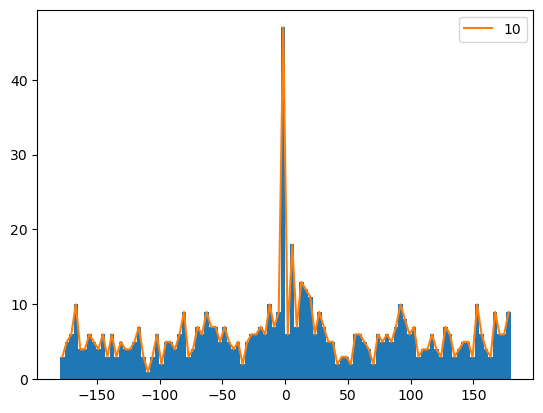

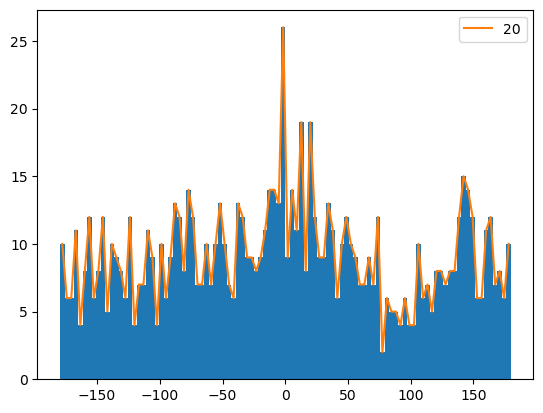

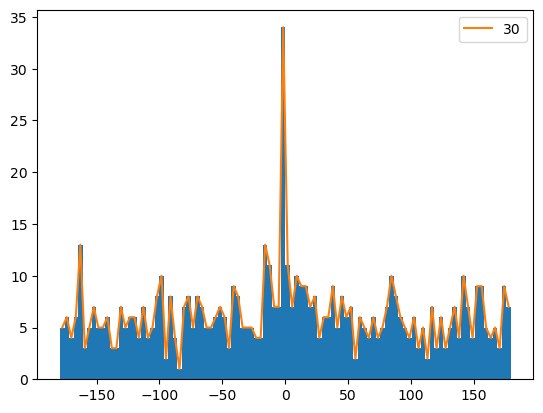

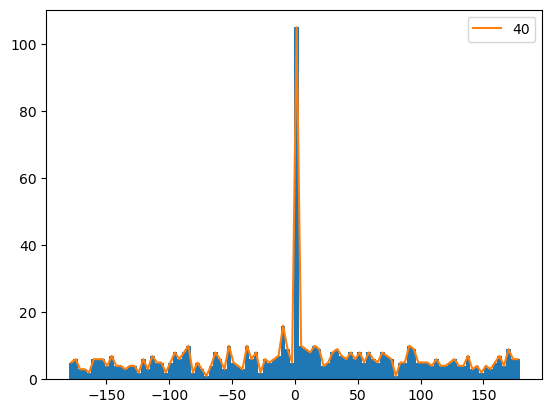

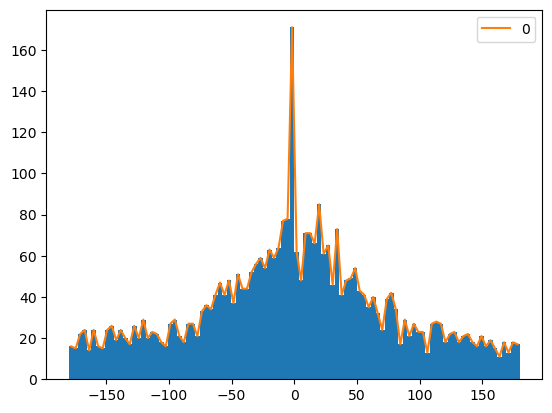

...

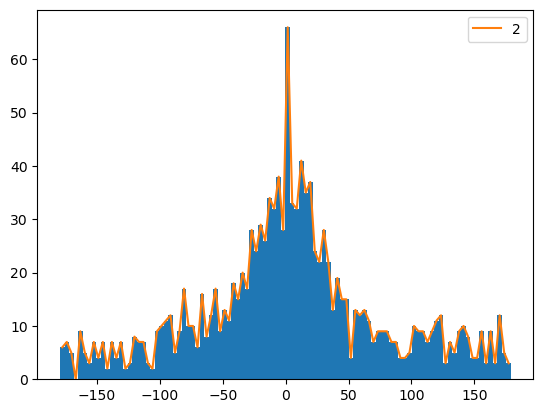

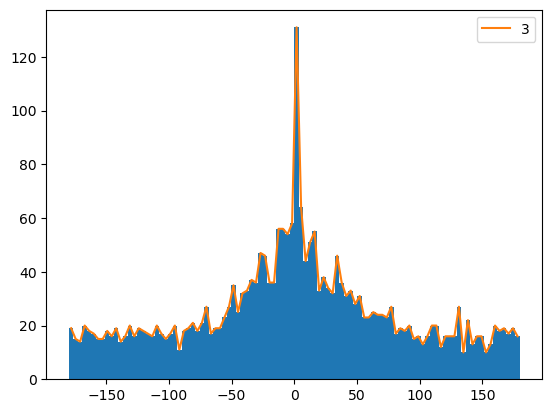

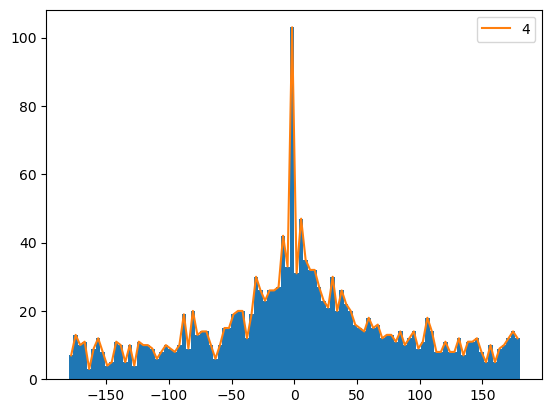

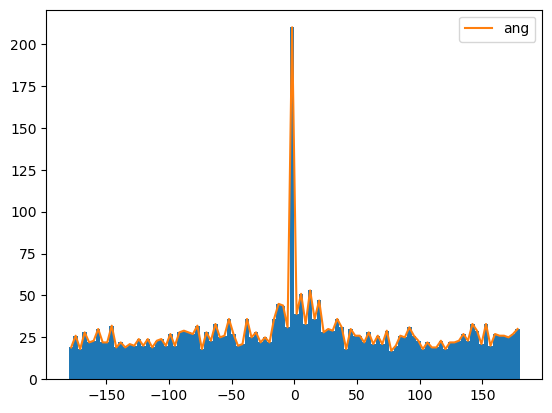

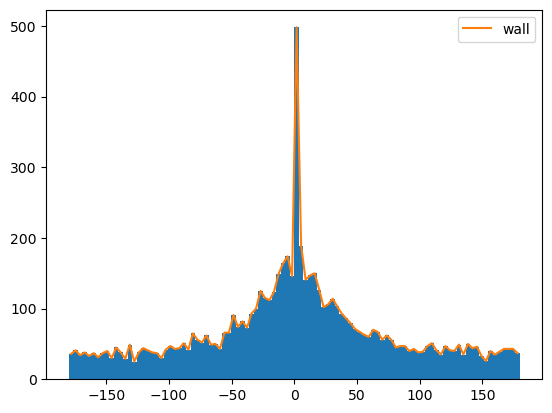

In [115]:
mergDfs = {'10':df10, '20':df20, '30':df30, '40':df40, '0':df0, '1':df1, '2':df2, '3':df3, '4':df4, 'ang': dfAng, 'wall':dfWall}

mergPlots = {}
for i in mergDfs:
    y, binEdges, _ = plt.hist(mergDfs[i], 100)
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    mergPlots[i]  = [x, y]
    plt.plot(x, y, label=i)
    plt.legend()
    plt.show()

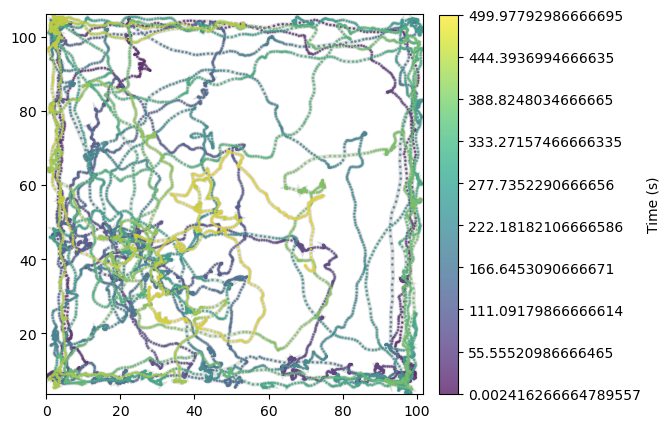

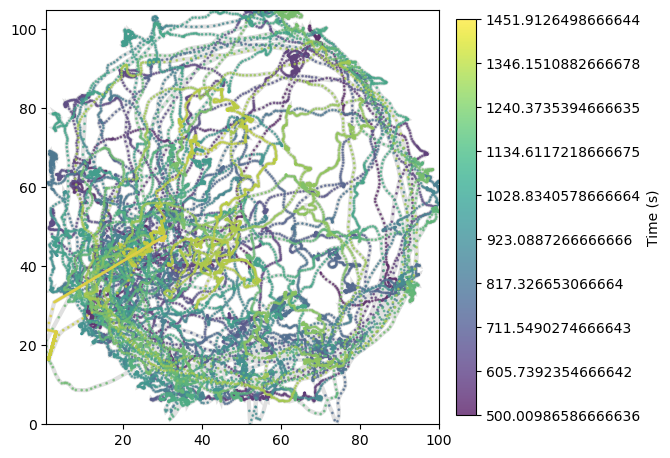

In [50]:

#df235 = makebasDF(235)
traja.plot(df235.loc[df235['time']<=500])
traja.plot(df235.loc[df235['time']>500])

<Figure size 640x480 with 0 Axes>

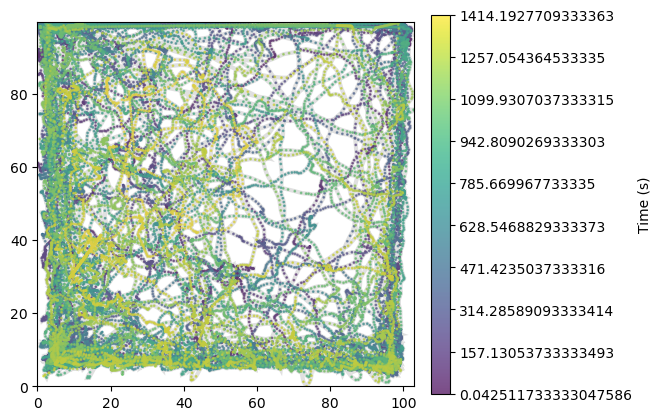

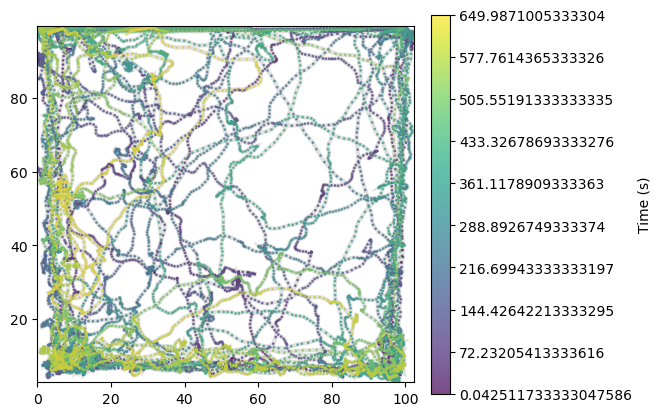

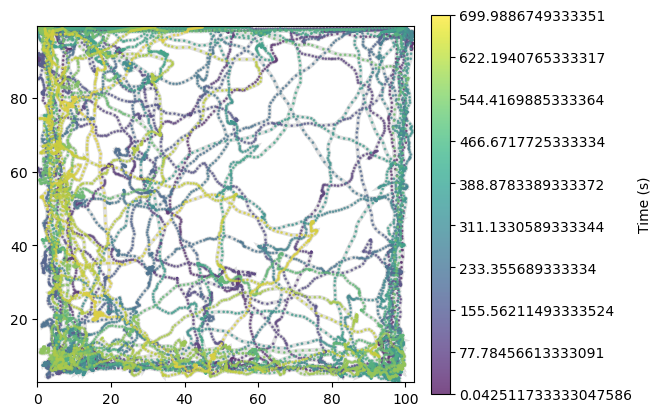

In [53]:
df165 = makebasDF(165)
traja.plot(df165.loc[df165['time']<=650])
traja.plot(df165.loc[df165['time']<=700])

<Figure size 640x480 with 0 Axes>

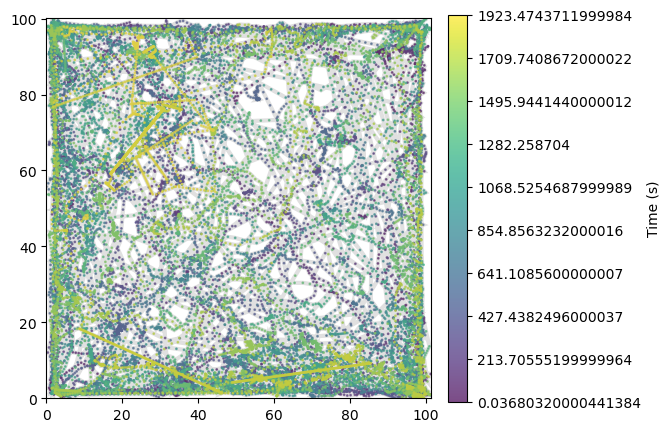

,time,x,y
0,0.036803,1.717897,7.242977
1,0.101238,1.804099,6.787384
2,0.165366,1.670926,6.777222
3,0.229098,1.344376,5.804426
4,0.293456,1.017826,4.831630
...,...,...,...
28927,1923.218486,10.790374,47.376621
28928,1923.282166,10.868630,47.632575
28929,1923.346422,10.741499,48.086064
28930,1923.410333,10.350916,48.195893


In [11]:
makebasDF(0)

<Figure size 640x480 with 0 Axes>

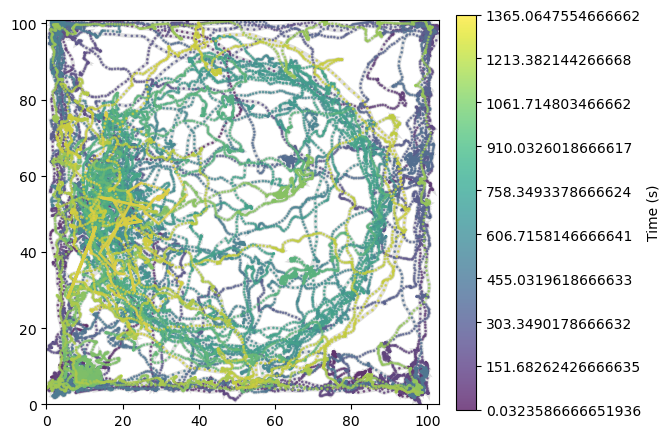

False False


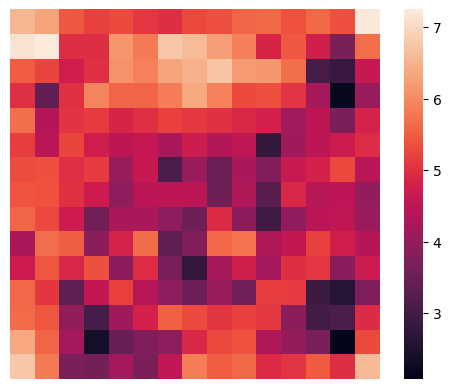

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\468701531.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx


41066
2601


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\2799013493.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\2799013493.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 4
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\2799013493.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 40
C:\Us

20.543447500000006 80.73467295454546


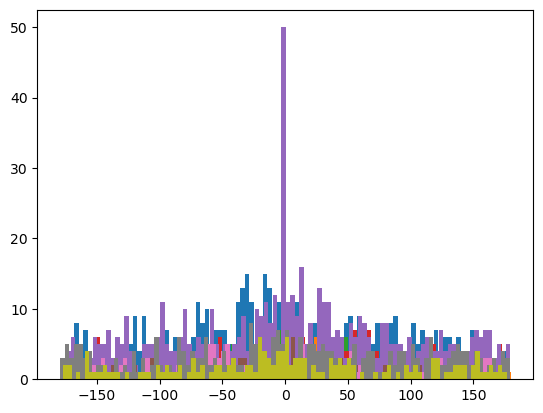

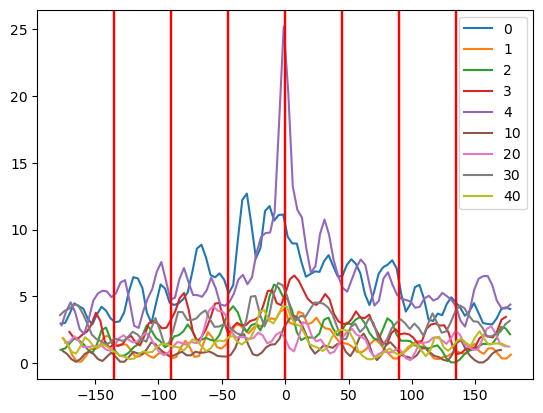

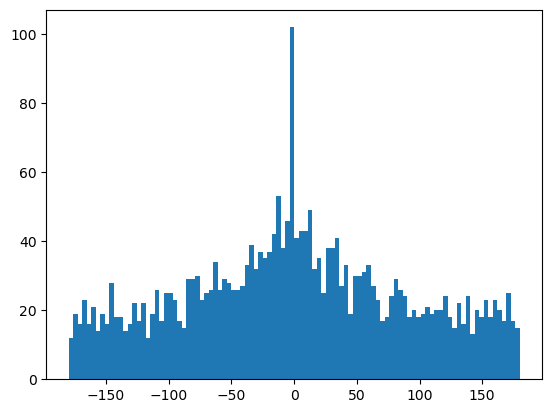

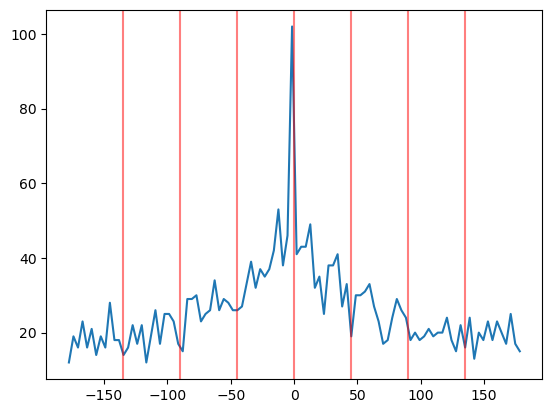

In [66]:
analys(25)

<Figure size 640x480 with 0 Axes>

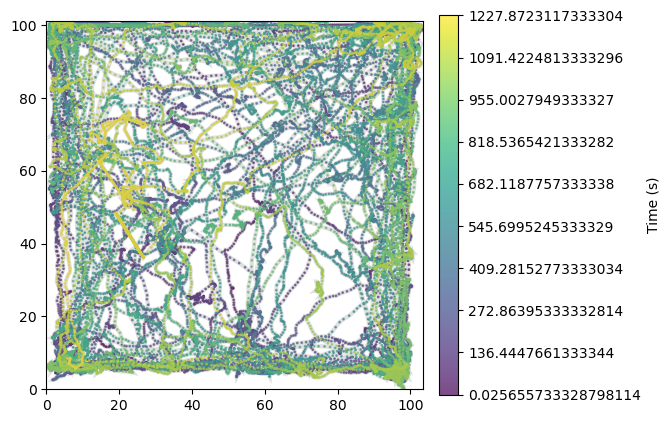

False False


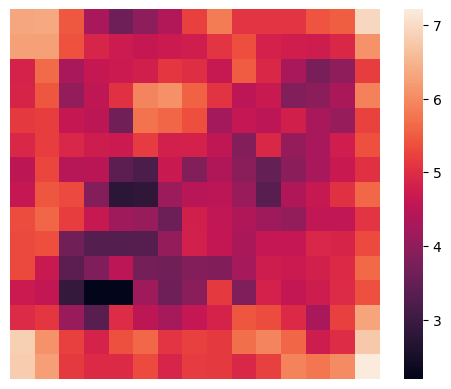

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\468701531.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx


36938
2340


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\2799013493.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 30
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\2799013493.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\2799013493.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Us

20.97031568181818 81.14874340909091


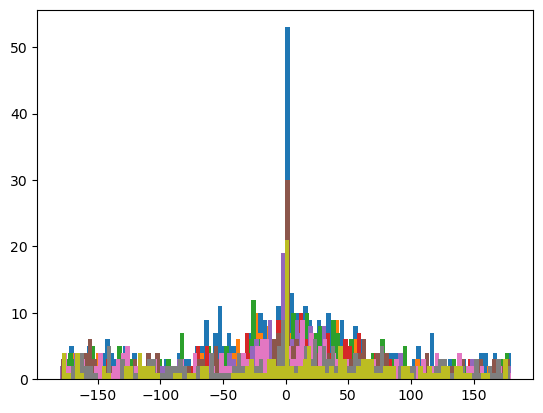

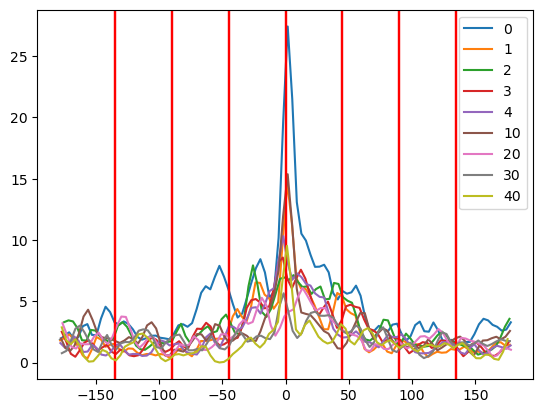

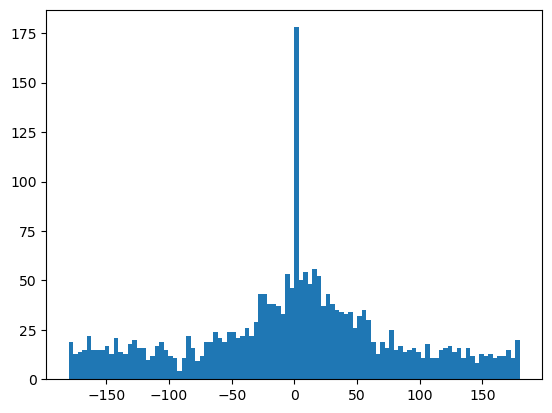

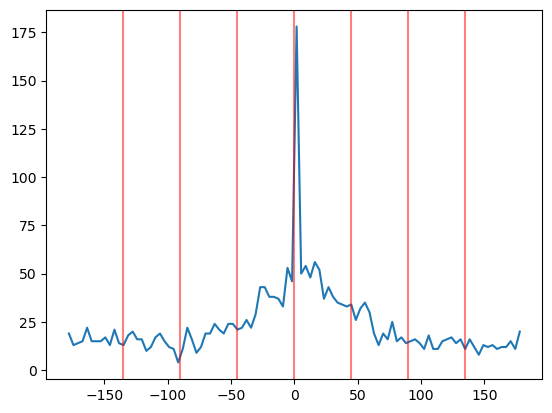

In [69]:
analys(91)

## draft

In [ ]:

def analys(n):
    x = data_frame_with_cells['trajectory_x'].iloc[n] 
    y = data_frame_with_cells['trajectory_y'].iloc[n]
    time = data_frame_with_cells['trajectory_times'].iloc[n]
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    plt.figure()
    #traja.plot(df)
    plt.show()
    
    plt.figure()
    occ = occupMapNorm(df)
    plt.show()
    
    df = addFilteredV(df)
    
    print(len(df))
    df = returnStepsDFdeltaAng(df, 0.5)
    print(len(df))
    
    df = addNearWalls(df)
    
    hist = {}
    plt.figure()
    for numb in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
        #all_hist[str(numb)] = {}
        dffor1line = df.loc[df['near_wall'] == numb]
        y, binEdges, _ = plt.hist(dffor1line['delta_angle'], 100)
        x = 0.5 * (binEdges[1:] + binEdges[:-1])
        hist[numb] = [x, y]
    plt.show()
        
    histc = hist.copy()
    for i in histc:
        histc[i][1] = gaussian_filter1d(histc[i][1], 1)
    plt.figure()
    for i in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
        #ax = plt.gca()
        #ax.set_xlim([-90, 270])
        #ax.set_ylim([0, 60])
        tit = str(i)
        plt.axvline(x=0, c='red', alpha=.5)
        plt.axvline(x=45, c='red', alpha=.5)
        plt.axvline(x=90, c='red', alpha=.5)
        plt.axvline(x=135, c='red', alpha=.5)
        plt.axvline(x=-45, c='red', alpha=.5)
        plt.axvline(x=-90, c='red', alpha=.5)
        plt.axvline(x=-135, c='red', alpha=.5)
        plt.plot(histc[i][0], histc[i][1], label=str(i))
    plt.legend()
    plt.show()
    
    y, binEdges, _ = plt.hist(df['delta_angle'], 100)
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    plt.figure()
    plt.plot(x,y)
    plt.axvline(x=0, c='red', alpha=.5)
    plt.axvline(x=45, c='red', alpha=.5)
    plt.axvline(x=90, c='red', alpha=.5)
    plt.axvline(x=135, c='red', alpha=.5)
    plt.axvline(x=-45, c='red', alpha=.5)
    plt.axvline(x=-90, c='red', alpha=.5)
    plt.axvline(x=-135, c='red', alpha=.5)
    plt.show()
    
    return df
    



##### создадим таблицу

In [34]:
x = data_frame_with_cells['trajectory_x'].iloc[304] 
y = data_frame_with_cells['trajectory_y'].iloc[304]
time = data_frame_with_cells['trajectory_times'].iloc[304]
zipped = list(zip(time,x, y))

df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])

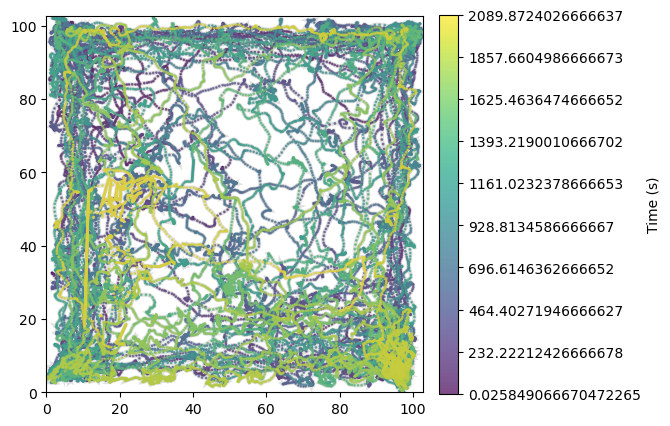

In [36]:
traja.plot(df)

print(len(data_frame_with_cells['position_y'].iloc[54]))
print(len(data_frame_with_cells['trajectory_times'].iloc[54]))

In [38]:
df

,time,x,y
0,0.025849,11.901777,99.913227
1,0.057516,11.684498,99.948716
2,0.089555,11.254984,99.884977
3,0.120953,10.882447,99.410818
4,0.169939,10.768348,98.572455
...,...,...,...
62865,2089.743955,81.675153,22.918261
62866,2089.775519,81.323812,22.644659
62867,2089.808275,80.933607,22.441182
62868,2089.839929,80.545982,22.259545


In [40]:
def occupMapNorm(df):
    xmin = df["x"].min() - 0.1
    xmax = df["x"].max() + 0.1
    binx = np.linspace(xmin, xmax, 16)
    x_cut = pd.cut(df.x, binx, right=False)
    #делаем df где будет понятно сколько было точек в каждом бине 
    #соответсвуеющему данному интервалу х и данному интервалу у
    ymin = df["y"].min() - 0.1
    ymax = df["y"].max() + 0.1
    biny = np.linspace(ymin, ymax, 16)
    y_cut = pd.cut(df.y, biny, right=False)
    dfn = df.groupby([x_cut, y_cut]).count()
    
    print(x_cut.isnull().values.any(), y_cut.isnull().values.any())
    
    dfn = dfn.drop(columns=['y', 'x'])
    dfn = dfn.rename(columns={'time': 'Count'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    dd = dd.replace(0, 1.e-1)
    arrd = dd.to_numpy()
    arrl = np.log(arrd)
    arrsrsr = np.sqrt(np.sqrt(np.sqrt(arrd)))
    #sns.heatmap(arrl, square=True)
    sns.heatmap(arrl, square=True, xticklabels=False, yticklabels=False)
    return(arrl)
    

False False


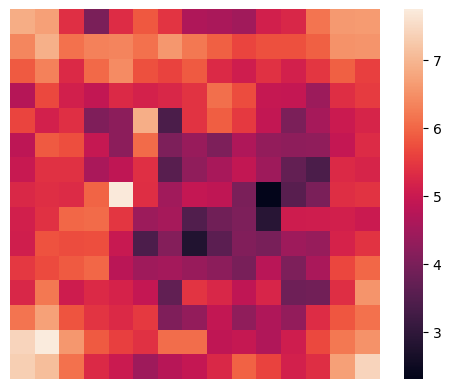

In [41]:
occ = occupMapNorm(df)

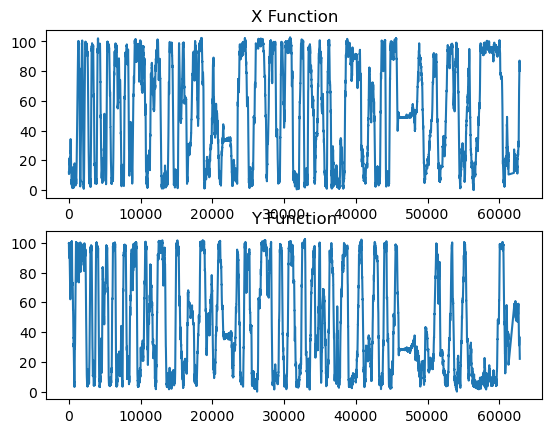

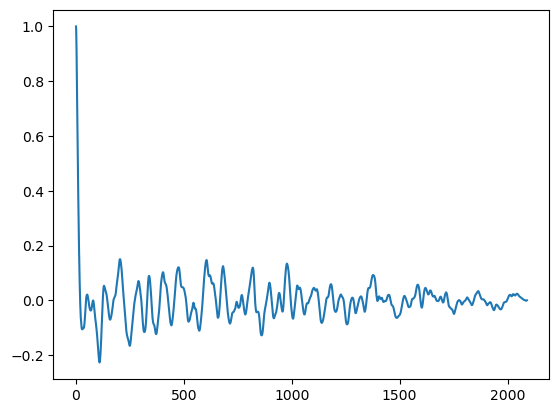

62870


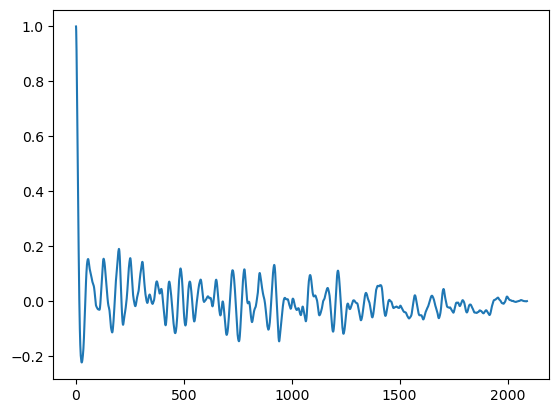

In [45]:
figure, axis = plt.subplots(2, 1)
axis[0].plot(df['x'])
axis[0].set_title("X Function")
  
# For Cosine Function
axis[1].plot(df['y'])
axis[1].set_title("Y Function")

i = df
if True:
    #x
    datax = i['x']
    lags = range(len(i))
    acorrx = sm.tsa.acf(datax, nlags = len(lags)-1, fft=False)
    #acorrx
    #plt.title(names[j] + ', x')
    plt.figure()
    plt.plot(df['time'],acorrx)
    plt.show()
    #Nn = len(acorrx)
    #yff = fft(acorrx)
    #xff = fftfreq(Nn, 1 / 40)
    #plt.plot(xff, np.abs(yff))
    #plt.show()
    
    #y
    datay = i['y']
    print(len(datay))
    # Delay (lag) range that we are interesting in
    lags = range(len(datay))
    acorry = sm.tsa.acf(datay, nlags = len(lags)-1, fft=False)
    acorry
    #plt.title(names[j] + ', y')
    plt.figure()
    plt.plot(df['time'],acorry)
    #j+=1
    plt.show()

In [46]:
#мы добавляем фильтр скорость и НЕФИЛЬТРОВАННЫЕ углы
def addFilteredV(df):
    vx = []
    vy = []
    v = []
    ang = []
    boo = True
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
            # угол
            #хз что делать с 0
            x = vvy/vvx
            if vvx >= 0:
                res = math.degrees(math.atan(x))
            else:
                res = 180 + math.degrees(math.atan(x))
            #убираем перевод в наглядную окружность. пусть остается тригонометрическая
            #if res <= 0:
                #res = -res + 90
                #вообще можно было бы записать и это как 360 - res + 90, т к лишние 360 и так вычитаются через пару строчек
            #elif res > 0:
                #res = 360 - res + 90
            if res >= 360:
                res -= 360
            ang.append(res)
            if boo:
                ang.append(res)
                boo = False
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df.insert(6, "angles", ang)
    df['V'] = pd.Series(gaussian_filter1d(df['V'], 3))
    df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 3))
    df['Vy'] = pd.Series(gaussian_filter1d(df['Vy'], 3))
    return(df)

In [47]:
df = addFilteredV(df)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22448\468701531.py:25: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx


In [48]:
def returnStepsDFdeltaAng(df, dur):
    time_last = df['time'][0]
    ind_good = [0]
    for i in range(1, len(df)):
        if df['time'][i] - time_last >= dur:
            time_last = df['time'][i]
            ind_good.append(i)    
    df = df.iloc[ind_good]
    df = df.reset_index()
    df = df.drop(['index'], axis=1)
    #delAng = [0] * len(df) - лучше не делать так, а то мы не увидим ошибки типа нанов
    delAng = [0]
    for i in range(1,len(df)):
        d = df['angles'][i]-df['angles'][i-1]
        if d > 180:
            d = d - 360
        if d < -180:
            d = d + 360
        delAng.append(d)
    df['delta_angle'] = delAng
    return df

In [49]:
print(len(df))
df = returnStepsDFdeltaAng(df, 0.5)
print(len(df))

62870
3982


In [50]:
def addNearWalls(trN):    
    bord_trN = {'xmi':trN['x'].min(), 'xma': trN['x'].max(), 'ymi':trN['y'].min(), 'yma':trN['y'].max()}
    trN['near_wall'] = 0
    ylength = bord_trN['yma'] - bord_trN['ymi'] 
    xlength = bord_trN['xma'] - bord_trN['xmi'] 
    xl = bord_trN['xmi']  + xlength * 0.2
    xr = bord_trN['xma']  - xlength * 0.2
    yd = bord_trN['ymi']  + ylength * 0.2
    yu = bord_trN['yma']  - ylength * 0.2
    
    for i in range(len(trN)):     
        if trN['x'].iloc[i] < xl:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 40
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 30
            else:
                trN['near_wall'].iloc[i] = 4
        elif trN['x'].iloc[i] > xr:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 10
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 20
            else:
                trN['near_wall'].iloc[i] = 2
        elif trN['y'].iloc[i] > yu:
            trN['near_wall'].iloc[i] = 1
        elif trN['y'].iloc[i] < yd:
            trN['near_wall'].iloc[i] = 3
    print(yd, yu)
    
    return trN

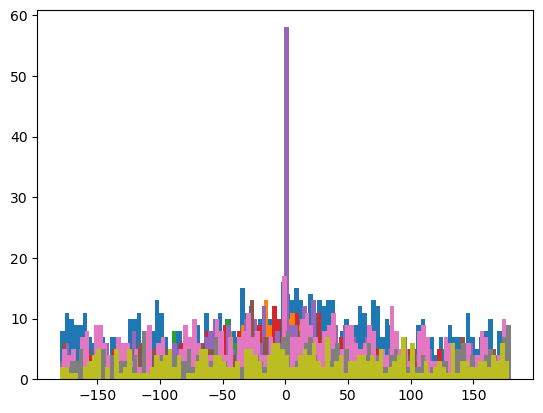

In [52]:
hist = {}
for numb in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    #all_hist[str(numb)] = {}
    dffor1line = df.loc[df['near_wall'] == numb]
    y, binEdges, _ = plt.hist(dffor1line['delta_angle'], 100)
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    hist[numb] = [x, y]

In [54]:
histc = hist.copy()
for i in histc:
    histc[i][1] = gaussian_filter1d(histc[i][1], 1)

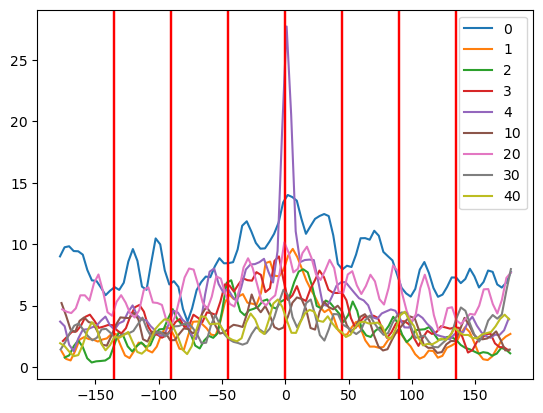

In [55]:
for i in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    #ax = plt.gca()
    #ax.set_xlim([-90, 270])
    #ax.set_ylim([0, 60])
    tit = str(i)
    plt.axvline(x=0, c='red', alpha=.5)
    plt.axvline(x=45, c='red', alpha=.5)
    plt.axvline(x=90, c='red', alpha=.5)
    plt.axvline(x=135, c='red', alpha=.5)
    plt.axvline(x=-45, c='red', alpha=.5)
    plt.axvline(x=-90, c='red', alpha=.5)
    plt.axvline(x=-135, c='red', alpha=.5)
    plt.plot(histc[i][0], histc[i][1], label=str(i))
plt.legend()
    #plt.title(tit)
    #plt.savefig('C:\\Users\\Lenovo\\1navigation\\angles_hist\\delta_ang\\'+tit)
    #plt.show()

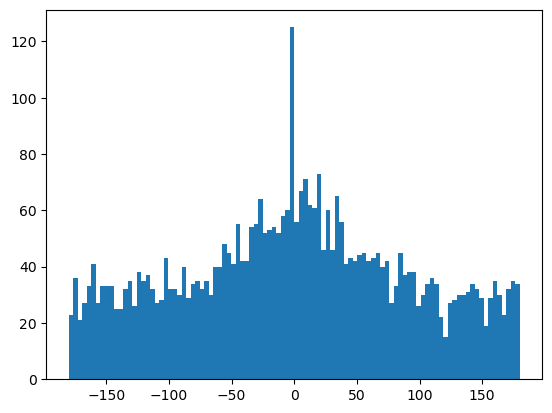

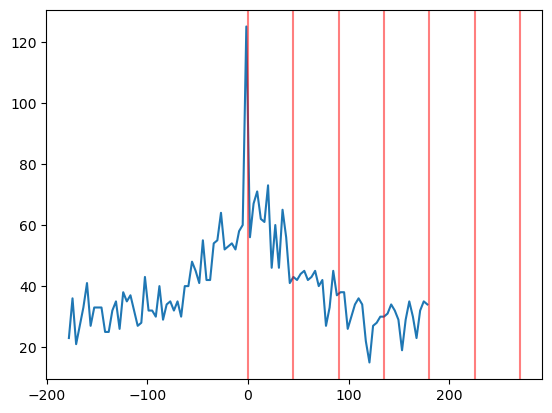

In [56]:
y, binEdges, _ = plt.hist(df['delta_angle'], 100)
x = 0.5 * (binEdges[1:] + binEdges[:-1])
plt.figure()
plt.plot(x,y)
plt.axvline(x=0, c='red', alpha=.5)
plt.axvline(x=45, c='red', alpha=.5)
plt.axvline(x=90, c='red', alpha=.5)
plt.axvline(x=135, c='red', alpha=.5)
plt.axvline(x=180, c='red', alpha=.5)
plt.axvline(x=225, c='red', alpha=.5)
plt.axvline(x=270, c='red', alpha=.5)


## draft

In [11]:
len(data_frame_with_cells['position_x'].iloc[100])

12185

In [12]:
len(data_frame_with_cells['position_y'].iloc[100])

12185

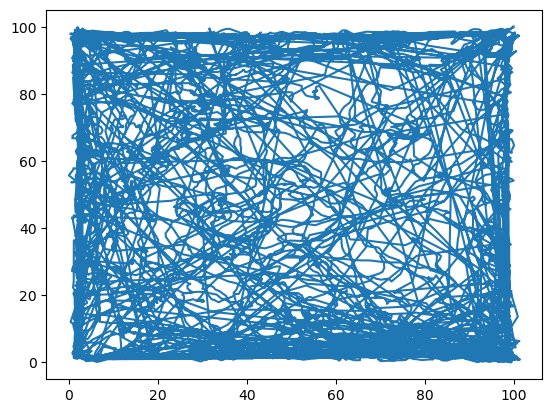

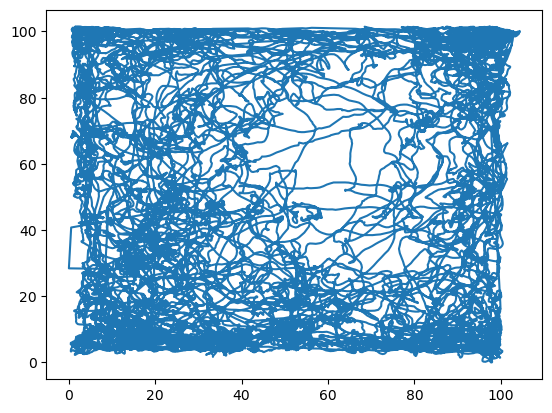

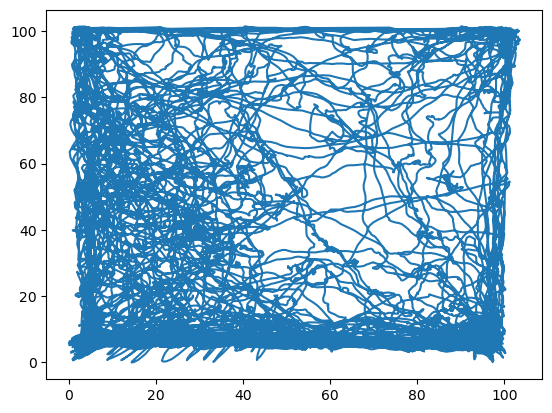

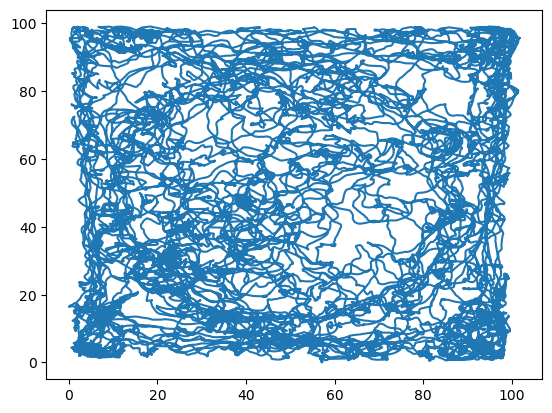

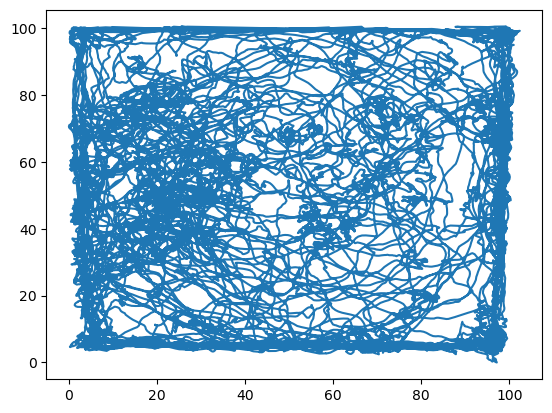

...

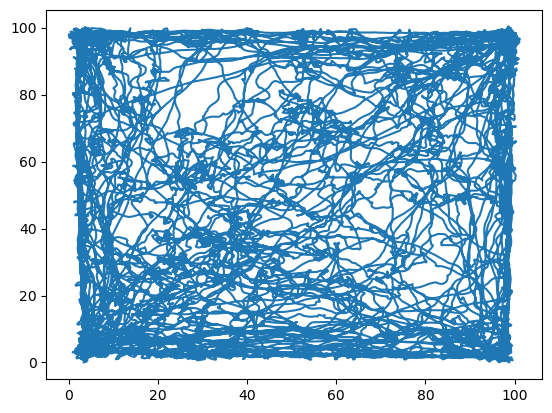

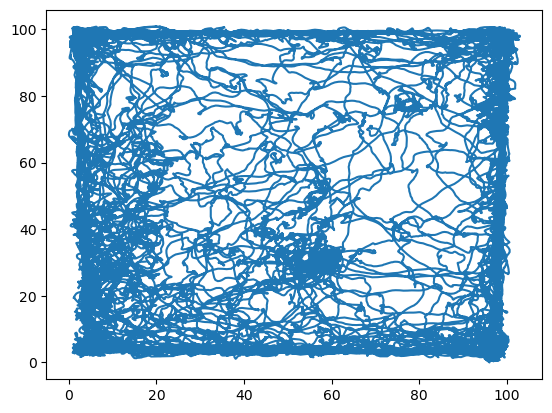

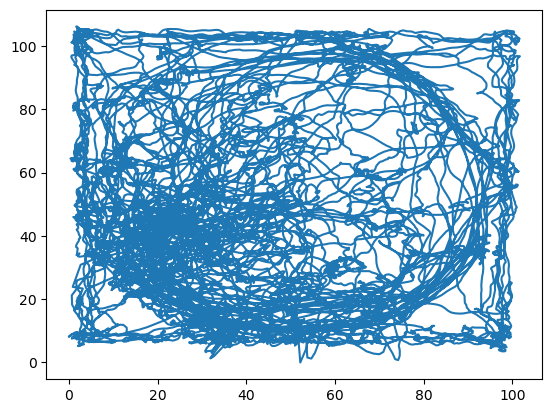

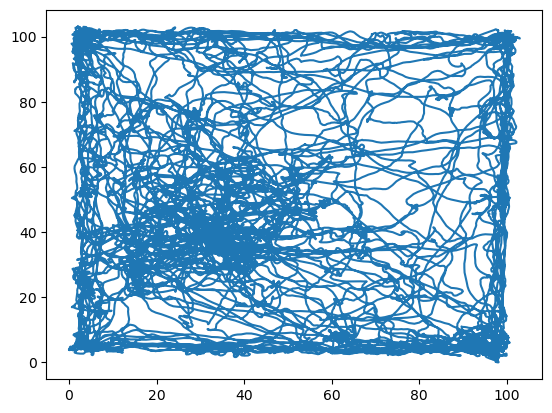

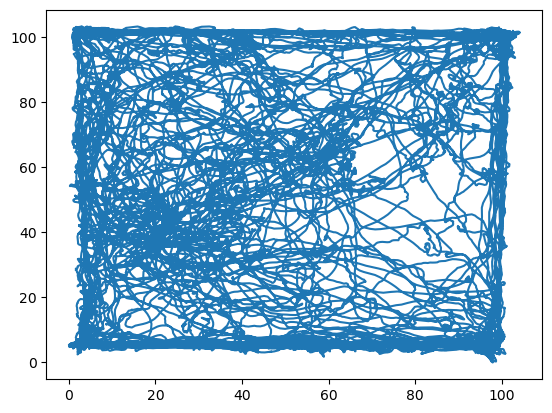

In [42]:
for i in range(0,300,20):
    plt.figure()
    plt.plot(data_frame_with_cells['trajectory_x'].iloc[i], data_frame_with_cells['trajectory_y'].iloc[i])
    plt.show()

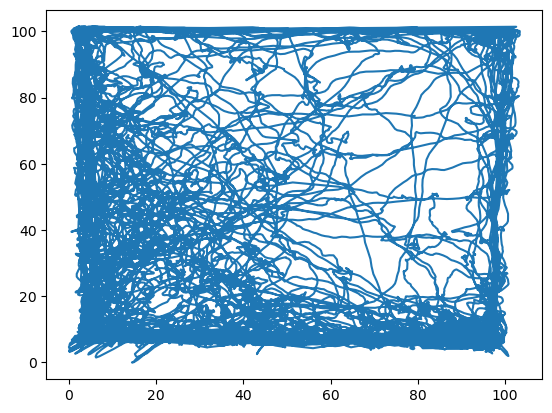

In [29]:
plt.plot(data_frame_with_cells['trajectory_x'].iloc[54], data_frame_with_cells['trajectory_y'].iloc[54])

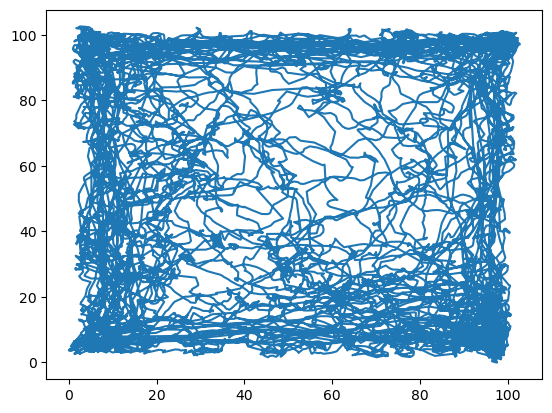

In [19]:
plt.plot(data_frame_with_cells['position_x'].iloc[304], data_frame_with_cells['position_y'].iloc[304])

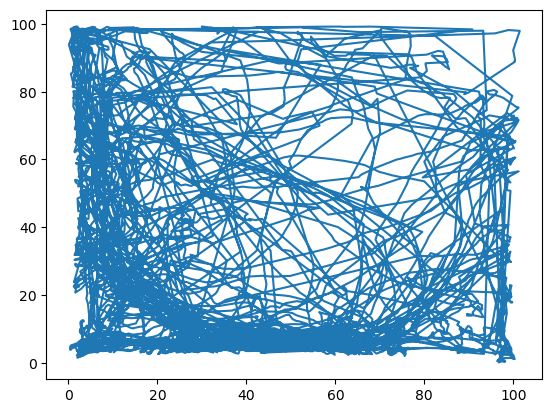

In [15]:
plt.plot(data_frame_with_cells['position_x'].iloc[100], data_frame_with_cells['position_y'].iloc[100])

In [ ]:
#мы добавляем фильтр скорость и НЕФИЛЬТРОВАННЫЕ углы
def addFilteredV(df):
    vx = []
    vy = []
    v = []
    ang = []
    boo = True
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
            # угол
            #хз что делать с 0
            x = vvy/vvx
            if vvx >= 0:
                res = math.degrees(math.atan(x))
            else:
                res = 180 + math.degrees(math.atan(x))
            #убираем перевод в наглядную окружность. пусть остается тригонометрическая
            #if res <= 0:
                #res = -res + 90
                #вообще можно было бы записать и это как 360 - res + 90, т к лишние 360 и так вычитаются через пару строчек
            #elif res > 0:
                #res = 360 - res + 90
            if res >= 360:
                res -= 360
            ang.append(res)
            if boo:
                ang.append(res)
                boo = False
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df.insert(6, "angles", ang)
    df['V'] = pd.Series(gaussian_filter1d(df['V'], 3))
    df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 3))
    df['Vy'] = pd.Series(gaussian_filter1d(df['Vy'], 3))
    return(df)

def returnStepsDFdeltaAng(df, dur):
    time_last = df['time'][0]
    ind_good = [0]
    for i in range(1, len(df)):
        if df['time'][i] - time_last >= dur:
            time_last = df['time'][i]
            ind_good.append(i)    
    df = df.iloc[ind_good]
    df = df.reset_index()
    df = df.drop(['index'], axis=1)
    #delAng = [0] * len(df) - лучше не делать так, а то мы не увидим ошибки типа нанов
    delAng = [0]
    for i in range(1,len(df)):
        d = df['angles'][i]-df['angles'][i-1]
        if d > 180:
            d = d - 360
        if d < -180:
            d = d + 360
        delAng.append(d)
    df['delta_angle'] = delAng
    return df

def addNearWalls(trN):    
    bord_trN = {'xmi':trN['x'].min(), 'xma': trN['x'].max(), 'ymi':trN['y'].min(), 'yma':trN['y'].max()}
    trN['near_wall'] = 0
    ylength = bord_trN['yma'] - bord_trN['ymi'] 
    xlength = bord_trN['xma'] - bord_trN['xmi'] 
    xl = bord_trN['xmi']  + xlength * 0.1
    xr = bord_trN['xma']  - xlength * 0.1
    yd = bord_trN['ymi']  + ylength * 0.1
    yu = bord_trN['yma']  - ylength * 0.1
    
    for i in range(len(trN)):     
        if trN['x'].iloc[i] < xl:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 40
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 30
            else:
                trN['near_wall'].iloc[i] = 4
        elif trN['x'].iloc[i] > xr:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 10
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 20
            else:
                trN['near_wall'].iloc[i] = 2
        elif trN['y'].iloc[i] > yu:
            trN['near_wall'].iloc[i] = 1
        elif trN['y'].iloc[i] < yd:
            trN['near_wall'].iloc[i] = 3
    print(yd, yu)
    
    return trN
